#

# Sentiment Analysis and Topic Modeling

#

The goals of this work is to perform sentiment analysis and topic modelling for clothing reviews. This will help identify the emotional polarity and the factors that contribute to the positive, negative, or neutral sentiments expressed in clothing reviews. Further, topic modeling will help discover prevalent topics and categorise the reviews into different themes, exploring relationships between topics.

Overall, by transforming large volumes of text data into actionable information and applying sentiment analysis and topic modeling to clothing reviews will support decision-making for the clothing business by identifying areas for improvement, via data-driven decisions, leading to improved customer experiences and more effective business strategies in the business.

#

In [1]:
# Importing necessary packages

import pandas as pd
import numpy as np

# Visualisations libraries
from colorama import Fore, Style
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS

# NLP libraries
import spacy 
from spacy import displacy
import nltk, nltk.classify
from nltk.corpus import words, stopwords, wordnet
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize
from collections import Counter
import re
from nltk.stem.porter import PorterStemmer
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
from nrclex import NRCLex
from textblob import *
from collections import Counter

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, ConfusionMatrixDisplay
from sklearn.naive_bayes import BernoulliNB
from sklearn.feature_extraction.text import TfidfVectorizer as Tfid
from sklearn.naive_bayes import MultinomialNB
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import KFold


import pyLDAvis.sklearn
import pyLDAvis.gensim_models as gensimvis

import gensim
from gensim.models import CoherenceModel
from gensim import corpora
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
from gensim.models import HdpModel
from gensim.corpora import MmCorpus

import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences



#

In [2]:
# Load the SpaCy NLP model
nlp = spacy.load('en_core_web_sm')

In [3]:
nltk.download('words')
nltk.download('vader_lexicon')

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\wikto\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\wikto\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

#

In [4]:
# Read the Excel file
df = pd.read_excel('MS4H05_Dataset.xlsx')

#

In [9]:
# Preview the file
df.head(5)

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


#

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Unnamed: 0               23486 non-null  int64 
 1   Clothing ID              23486 non-null  int64 
 2   Age                      23486 non-null  int64 
 3   Title                    19676 non-null  object
 4   Review Text              22641 non-null  object
 5   Rating                   23486 non-null  int64 
 6   Recommended IND          23486 non-null  int64 
 7   Positive Feedback Count  23486 non-null  int64 
 8   Division Name            23472 non-null  object
 9   Department Name          23472 non-null  object
 10  Class Name               23472 non-null  object
dtypes: int64(6), object(5)
memory usage: 2.0+ MB


#

-----------------------------------------------------------------------------------------------------------------------

#

Columns and how they can contribute towards the analysis:


#


Clothing ID = identifier for each clothing item- doesn't directly contribute to sentiment analysis

Age = age of the reviewers- could explore if sentiment varies based on different age groups.

Title = headings of the reviews, the sentiment expressed in these can be a brief indication of the overall sentiment of the corresponding review

Review Text = primary text data for sentiment analysis. Can classify reviews into positive, negative, or neutral sentiments, or assign sentiment scores to individual reviews.

Rating = numerical rating (scale of 1 - 5 ). Can convert it into sentiment labels (1-2 = negative, 3 = neutral, 4-5 =positive). 

Recommended IND: whether the reviewer recommended the product or not. It can be used for a classification task.

Positive Feedback Count: count of positive feedback received for each review-> can provide an additional signal for sentiment analysis

Division Name, Department Name, Class Name: These columns provide categorical information about the division, department, and class of the clothing item being reviewed. You can analyze sentiment based on these categories to identify if sentiment varies across different divisions, departments, or classes of clothing

#

In [5]:
# Dropping unwanted columns
df.drop(labels =['Clothing ID','Title', 'Unnamed: 0'],axis = 1,inplace = True)

df

,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,34,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,60,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,50,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,47,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
...,...,...,...,...,...,...,...,...
23481,34,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses
23482,48,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits
23483,31,"This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses
23484,28,I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses


#

#

# ----------------------- Cleaning + Preprocessing --------------------

#

I will be removing noise from the data, including special characters, punctuation, HTML tags, stopwords and also lowercasing the review text. This will improve the quality of the data so that it is ready for the upcoming steps

#

<Axes: >

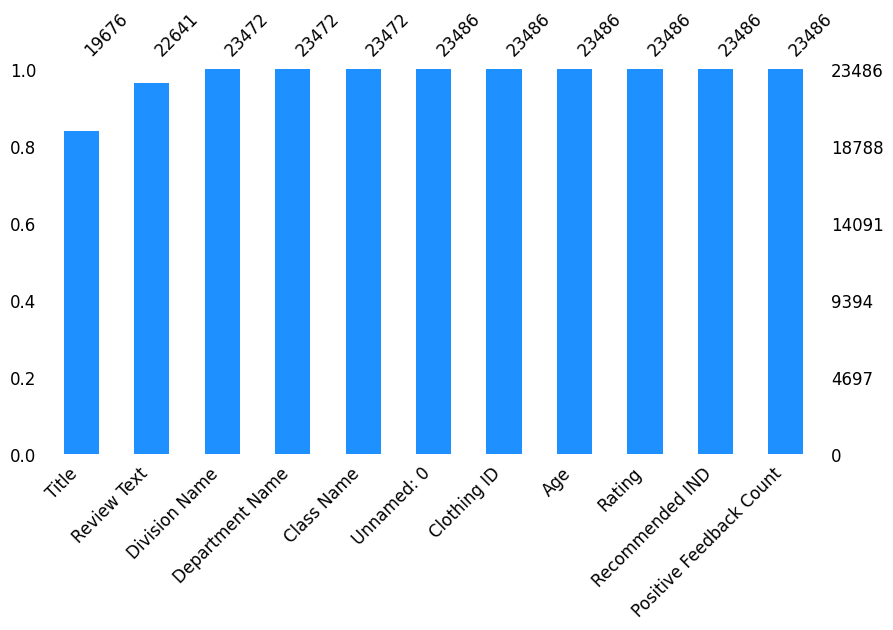

In [54]:
# Missing values
msno.bar(df, color="dodgerblue", sort="ascending", figsize=(10,5), fontsize=12)

#

As identified via the above plot, columns title, review text, division name, department name and class name have some missing values. I will further explore this.

#

#

#

In [6]:
# Find rows with null values in both 'Ratin' and 'Review Text' columns
null_rows = df[df['Rating'].isnull() & df['Review Text'].isnull()]

null_rows

,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name


#

In [6]:
# Dropping columns which don't have any review

df = df[~df['Review Text'].isnull()]

df

,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,34,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,60,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,50,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,47,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
...,...,...,...,...,...,...,...,...
23481,34,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses
23482,48,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits
23483,31,"This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses
23484,28,I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses


#

In [7]:
# Check for duplicate rows
duplicate_rows = df.duplicated()

# Print the duplicate rows
if any(duplicate_rows):
    print("Duplicate rows:")
    print(df[duplicate_rows])
else:
    print("No duplicate rows found.")

No duplicate rows found.


#

#

To help understand the data spread and shape, I will now plot histograms for the key variables: 'Positive Feedback Count', 'Department Name', 'Rating', 'Recommended IND','Age' and 'Clothing ID'.

#

In [10]:
 # df columns I'll be plotting
columns = ['Positive Feedback Count', 'Department Name', 'Rating',
          'Recommended IND', 'Age', 'Class Name']

fig = sp.make_subplots(rows=2, cols=3, subplot_titles=columns)

traces = [
    go.Histogram(x=df['Positive Feedback Count'], nbinsx=30),
    go.Bar(x=df['Department Name'].value_counts().index, y=df['Department Name'].value_counts().values),
    go.Bar(x=df['Rating'].value_counts().index, y=df['Rating'].value_counts().values),
    go.Bar(x=df['Recommended IND'].value_counts().index, y=df['Recommended IND'].value_counts().values),
    go.Histogram(x=df['Age'], nbinsx=30),
    go.Histogram(x=df['Class Name'], nbinsx=30)
]

row_col_pairs = [(1, 1), (1, 2), (1, 3), (2, 1), (2, 2), (2, 3)]

for trace, pair in zip(traces, row_col_pairs):
    row, col = pair
    fig.add_trace(trace, row=row, col=col)

fig.update_layout(height=600, width=1000, showlegend=False)

for i, title in enumerate(columns):
    fig.update_xaxes(title_text=title, row=(i // 3) + 1, col=(i % 3) + 1)

fig.update_yaxes(title_text='Frequency')

fig.show()

#

In [13]:
# Reference (G Ranjith kumar, 2020)
px.scatter(df, x="Age", y="Positive Feedback Count", facet_row="Recommended IND", 
           facet_col="Rating",trendline="ols",category_orders={"Rating": [1,2,3,4,5],'Recommended IND':[0,1]})

#

#

#

As observed, the higher ratings are more common when the recommended IND is equal to 1. This is contrary when the recommended IND is equal to 0, in this case, the lower ratings (1, 2, 3) are more common. This suggests a correlation between the columns. The age is relatively spread, however the late 30s age groups seems to be more prominent in a lot of the cases. Further, the positive feedback count for reviews seems to rise when hte recommended IND and rating align, i.e a high rating and a recommended IND of 1 have more positive feedback than then the rating in low for the same IND.

#

In [6]:
# Identify emoticons

def extract_emoji(text):
    emoji_pattern = r"(:-?\)|:-?D|;-?\)|;-?D|\(:|\(-?D|\s?XD\s?|:\'\(|:\'\))"
    emoji = re.findall(emoji_pattern, text)
    return emoji

texts = df['Review Text']
emoji = []
for text in texts:
    emoji.extend(extract_emoji(str(text)))

print(emoji)
print("Total number of emojis:", len(emoji))

[':-)', ':-)', ';)', ':-)', ':)', ':)', ':)', ':-)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ';)', ';)', ':)', ';)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ';)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':-)', ':-)', ':)', ':)', ':)', ':)', ':-)', ';)', ':)', ':)', ':)', ':)', ';-)', ';)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ';-)', ':)', ';)', ';)', ':)', ':)', ':-)', ':-)', ';)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ';)', ':)', ':)', ':-)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':-)', ':)', ':)', ':)', '(:', ':)', ';)', ':)', ':-)', ';)', ':-)', ';)', ':)', ':)', ':)', ':)', ':)', ';)', ';)', ':)', ':)', ':-)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ':)', ';)', ':)', ':)', ':)', ':)', ';)', ';)', ':)', ':)', ':-)', ':)', ':)', ':)', ';)', ';)', ':)', ':)', ':)', ';)', ':)', ':-)', ':-)', ':)', ':)', ':-)', ':)', ':)', ':)', ':)', ':-)', ':)', ':)', 

#

whilst emojis bring and enhance the sentiments of the reviews, I chose to remove them as they can be deceiving a lot of the time. For example this example review:

'Uncertain about sizing i got both the 4 & the 6...both made me look like a no-asser :( neither fit quite right in the leg. both hit at a weird point in my calf, not cute-short, just off. (i'm 5'8" and 125#) to quote my husband, "nope. not feeling these." that said, they feel great on, seem to be made well, but are heading back to an retailer near you :( sigh. the quest continues :)'

whilst the review is negative with two other negative emojis in the text, at the end the writer puts ':)' which is deceiving as during sentiment analysis it may be considered as a positive review.

#

- Text Cleaning:
        Remove any unwanted characters (including parentheses, brackets, and special symbols), that may not contribute to sentiment analysis.

- Lowercasing:
        Convert all text to lowercase to ensure consistent and generalised processing.

- Tokenization:
        Split the text into individual tokens or words. This step breaks down the text into its basic units, allowing further analysis on a word level.

- Stop Word Removal:
        Remove common words that do not carry significant meaning in sentiment analysis, such as articles, prepositions, or pronouns.

- Lemmatization:
        Reduce words to their base or root forms to normalize the text and reduce dimensionality.

I decided to use lemmatization instead of stemming, as lemmatization preserves the grammatical category of the word, producing lemmas that are actual words and capturing the intended meaning more accurately than stemming.


#

In [7]:
amp = df['Review Text'].str.extractall("(&amp)")
xa0 = df['Review Text'].str.extractall("(\xa0)")

print('Total &amp',len(amp[~amp.isna()]))
print('Total (\xa0)',len(xa0[~xa0.isna()]))

Total &amp 37
Total ( ) 6


#

In [7]:
# Clean up the text - remove various dashes, non-standard punctuation marks, HTML and unicode characters

def clean_text(text):
    text = re.sub('(--)|(_)|(—)|(-)', ' ', text)
    text = re.sub('“', '"', text)
    text = re.sub('”', '"', text)
    text = re.sub('\s+', ' ', text)
    text = re.sub('[.,!?\']', '', text)
    text = re.sub(
        u'(\ufeff)|(\u200b)|(\u200bc)|(\u200d)|(\u2060)|(\u180e)', ' ', text)
    text = text.replace('(&amp)', '')
    text = text.replace('\xa0', '')
    return text

df.loc[:,'Review Text'] = df['Review Text'].astype(str)
df_clean = df['Review Text'].apply(clean_text)

df_clean

<>:7: DeprecationWarning: invalid escape sequence '\s'
<>:7: DeprecationWarning: invalid escape sequence '\s'
C:\Users\wikto\AppData\Local\Temp\ipykernel_19676\1493921792.py:7: DeprecationWarning: invalid escape sequence '\s'
  text = re.sub('\s+', ' ', text)


0        Absolutely wonderful silky and sexy and comfor...
1        Love this dress its sooo pretty i happened to ...
2        I had such high hopes for this dress and reall...
3        I love love love this jumpsuit its fun flirty ...
4        This shirt is very flattering to all due to th...
                               ...                        
23481    I was very happy to snag this dress at such a ...
23482    It reminds me of maternity clothes soft stretc...
23483    This fit well but the top was very see through...
23484    I bought this dress for a wedding i have this ...
23485    This dress in a lovely platinum is feminine an...
Name: Review Text, Length: 22641, dtype: object

#

#

In [95]:
"""Pre-Processing"""

lemmatizer = WordNetLemmatizer()


def preProcessing(text):
    """
    Processes text string through various NLP pre-processing techniques
    and returns a reduced list of words suitable for producing a BoW model.
            
    EXAMPLE: 'Only the best dress will fit!' -> ['only', 'best', 'dress', 'fit']
    
    ARGS:
        text (string) - The raw text under consideration.
    
    RETURNS:
        text (list of string values) - A list of words that passed the pre-processing criteria from the string passed in.
    """
    text = re.sub(r'[^a-zA-Z]', " ", text.lower()).split() #Formatting Words
    text = list(set(text) - set(str(stopwords))) #Stop Word Removal
    text = list(set(text) & set(words.words())) #Non-Word Removal 
    for word in text:
        word = lemmatizer.lemmatize(word) #Lemmatization
    return text

# df['Reviews'] = df['Clean Text'].apply(preProcessing)

#

The above function takes too long to run on my current computational power, therefore for it to be more time efficient I will be running the quivalent open code.

#

In [8]:
# Formatting Words
processed_series = df_clean.apply(lambda text: re.sub(r'[^a-zA-Z]', " ", text.lower()).split())

In [9]:
# Stop Word Removal
stop_series = processed_series.apply(lambda text: list(set(text) - set(stopwords.words())))

#

The wordnet.synsets(word) function from NLTK's WordNet module is used to check if a word exists in WordNet's lexical database. If a word has at least one synset (meaningful definition) in WordNet, it is considered a valid English word. Therefore, only the words that have at least one synset are included in the resulting nonword_series.

By using wordnet.synsets(word) to check for the existence of a word in WordNet, you don't need to explicitly specify the English version. WordNet is a comprehensive lexical database for English, so it automatically considers English words.

Synset: a set of synonyms that share a common meaning. Each synset contains one or more lemmas, which represent a specific sense of a specific word.
WordNet is the lexical database i.e. dictionary for the English language, specifically designed for natural language processing. 

Synset is a special kind of a simple interface that is present in NLTK to look up words in WordNet. Synset instances are the groupings of synonymous words that express the same concept. Some of the words have only one Synset and some have several (GeeksforGeeks, 2019)



#

In [10]:
# eliminates any words from the review series that do not appear in the NLTK word corpus (not recognized as English words)

nonword_series = stop_series.apply(lambda text: [word for word in text if wordnet.synsets(word)])

In [11]:
lemmatizer = WordNetLemmatizer()

lemmatized_series = nonword_series.apply(lambda text: [lemmatizer.lemmatize(word) for word in text]) # Lemmatization

In [12]:
# add the series to the datas as a new column 'Lemmatized Reviews'
df.loc[:,'Lemmatized Reviews'] = lemmatized_series

C:\Users\wikto\AppData\Local\Temp\ipykernel_19676\215374415.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:,'Lemmatized Reviews'] = lemmatized_series


#

Apply the SpaCy NLP (Natural Language Processing) model to the reviews, helps with sentiment analysis and topic modeling as it includes various linguistic annotations such as part-of-speech tags, named entities  and dependency parse

#

In [13]:
# Apply the SpaCy NLP model to the reviews

def parse_review(review):
    parsed_review = nlp(str(review))
    return parsed_review

df_parsed = df['Lemmatized Reviews'].apply(parse_review)

#

------------------------------------------------------------------------------- TOKENS -------------------------------------------------------------------------------

#

In [14]:
# Obtain tokens that are not stop words, punctuation or spaces
tokens_list = []
for parsed_review in df_parsed:
    tokens = [token.text for token in parsed_review if not token.is_stop and not token.is_punct and not token.is_space]
    tokens_list.append(tokens)

tokens_list

[['absolutely', 'silky', 'sexy', 'comfortable', 'wonderful'],
 ['love',
  'store',
  'online',
  'hit',
  'midi',
  'dress',
  'find',
  'knee',
  'definitely',
  'happened',
  'ordered',
  'length',
  'bought',
  'pretty',
  'petite',
  'glad'],
 ['high',
  'flaw',
  'usual',
  'half',
  'zipper',
  'wanted',
  'cheap',
  'tight',
  'hope',
  'dress',
  'major',
  'ordered',
  'net',
  'outrageously',
  'fact',
  'fit',
  'work',
  'layer',
  'design',
  'nicely',
  'small',
  'sewn',
  'medium',
  'size',
  'directly',
  'zip',
  'comfortable',
  'reordered',
  'petite',
  'layer',
  'initially',
  'found'],
 ['fun',
  'fabulous',
  'love',
  'time',
  'jumpsuit',
  'great',
  'wear',
  'compliment'],
 ['love',
  'sleeveless',
  'legging',
  'cardigan',
  'pair',
  'shirt',
  'length',
  'flattering',
  'wear',
  'perfect',
  'adjustable',
  'tie'],
 ['love',
  'alteration',
  'foot',
  'shortening',
  'idea',
  'dress',
  'lot',
  'dress',
  'stranger',
  'p',
  'pretty',
  'work',


In [17]:
# Count the number of tokens using the Counter submodule

def token_count(tokens_list):
    all_tokens = []
    for tokens in tokens_list:
        all_tokens.extend(tokens)
    return Counter(all_tokens)

tokens_count = token_count(tokens_list)
tokens_count

Counter({'absolutely': 795,
         'silky': 125,
         'wonderful': 288,
         'comfortable': 2939,
         'sexy': 209,
         'length': 2414,
         'hit': 847,
         'love': 7461,
         'store': 1930,
         'bought': 2669,
         'petite': 1984,
         'knee': 653,
         'glad': 600,
         'dress': 6883,
         'pretty': 2034,
         'find': 898,
         'definitely': 1269,
         'ordered': 3463,
         'midi': 65,
         'happened': 68,
         'online': 1475,
         'found': 897,
         'half': 198,
         'zip': 167,
         'layer': 433,
         'reordered': 27,
         'fact': 213,
         'net': 4,
         'zipper': 338,
         'fit': 8869,
         'medium': 1920,
         'work': 2376,
         'nicely': 770,
         'tight': 1350,
         'sewn': 147,
         'high': 1087,
         'small': 3753,
         'initially': 87,
         'cheap': 308,
         'design': 1500,
         'hope': 308,
         'flaw': 131,
 

In [18]:
# Convert the token counts into a DataFrame, and sort the values in descending order

tokens_count_df = pd.DataFrame.from_dict(tokens_count, orient='index', columns=['Count'])
tokens_count_df.sort_values(by='Count', ascending=False, inplace=True)

In [22]:
# View the top 20 most frequent tokens in TWOTW

tokens_count_df.head(20)

,Count
fit,8869
love,7461
size,7214
dress,6883
color,6260
wear,5625
great,5186
fabric,4223
small,3753
ordered,3463


#

In [24]:
# Count the number of tokens using the Counter submodule
def token_count(tokens_list):
    all_tokens = []
    for tokens in tokens_list:
        all_tokens.extend(tokens)
    return Counter(all_tokens)

tokens_count = token_count(tokens_list)
tokens_count_df = pd.DataFrame.from_dict(tokens_count, orient='index', columns=['Count'])
tokens_count_df.sort_values(by='Count', ascending=False, inplace=True)

# Create the bar chart
fig = go.Figure(data=[go.Bar(
    x=tokens_count_df.index[:20],  # Select the top 20 tokens
    y=tokens_count_df['Count'][:20],  # Select the counts for the top 20 tokens
)])

# Customize the chart layout
fig.update_layout(
    title='Token Counts',
    xaxis_title='Tokens',
    yaxis_title='Count'
)

# Display the chart
fig.show()


#

In [26]:
# Obtain vocabulary and convert the list of tokens to a set by removing order + duplicates

def vocabulary(tokens_list):
    vocabulary = sorted(list(set(token for tokens in tokens_list for token in tokens)))
    return vocabulary

df_vocab = vocabulary(tokens_list)

#

In [27]:
# The difference between the N tokens and the N types (size of vocabulary)
tokens_list_len = len(tokens_list)
df_vocab_len = len(df_vocab)
difference = abs(tokens_list_len - df_vocab_len)

print("Length of tokens_list:", tokens_list_len)
print("Length of df_vocab:", df_vocab_len)
print("Difference:", difference)

Length of tokens_list: 22641
Length of df_vocab: 8769
Difference: 13872


#

------------------------------------------------------------------------------- LEMMAS -------------------------------------------------------------------------------

#

In [70]:
# Obtain the lemmas generated by the SpaCy NLP model

def get_lemmas(df_parsed):
    lemmas = [] # iterate over the tokens in each Doc 
    for parsed_review in df_parsed:
        lemmas.extend(token.lemma_.lower().strip() for token in parsed_review if
                      not token.is_stop and not token.is_punct and not token.is_space)
    return lemmas

df_lemmas = get_lemmas(df_parsed)

In [72]:
# count the lemmas

def get_lemmas_count(lemmas):
    return Counter(lemmas)

lemmas_count = get_lemmas_count(df_lemmas)

Counter({'silky': 127,
         'comfortable': 2939,
         'sexy': 214,
         'wonderful': 288,
         'absolutely': 795,
         'happen': 123,
         'hit': 880,
         'petite': 1984,
         'online': 1475,
         'glad': 600,
         'length': 2414,
         'find': 1929,
         'pretty': 2161,
         'order': 4522,
         'definitely': 1269,
         'dress': 7572,
         'buy': 3795,
         'knee': 653,
         'store': 1931,
         'love': 8721,
         'midi': 65,
         'layer': 757,
         'small': 4414,
         'flaw': 131,
         'sew': 199,
         'medium': 1920,
         'tight': 1700,
         'want': 1060,
         'nicely': 770,
         'design': 1614,
         'cheap': 331,
         'initially': 87,
         'size': 7912,
         'outrageously': 2,
         'zipper': 343,
         'directly': 11,
         'fact': 213,
         'work': 2704,
         'zip': 233,
         'usual': 862,
         'half': 198,
         'high': 134

In [73]:
# Convert the list of lemmas into a DataFrame

lemmas_df = pd.DataFrame.from_dict(lemmas_count, orient='index', columns=['Count'])
lemmas_df.sort_values(by='Count', ascending=False, inplace=True)

In [75]:
def bar_plot(data, title, x='Count', hue=None, color_continuous_scale='viridis'):
    data_sorted = data.sort_values(by=x, ascending=True)  # Sort the data by descending order
    
    max_value = data_sorted[x].max()  # Get the maximum value from the 'Count' column
    min_value = data_sorted[x].min()  # Get the minimum value from the 'Count' column
    
    fig = px.bar(data_frame=data_sorted, y=data_sorted.index, x=x, color=x, orientation='h',
                 labels={'y': '', 'x': x},
                 color_continuous_scale=color_continuous_scale,
                 range_color=[min_value, max_value],  # Set the color range to include the min and max values
                 title=title)
    
    fig.show()

bar_plot(lemmas_df.head(20), title='Top 20 Lemmas in Clothing Reviews')


#

To analyse grammatical relationship between words in the reviews, I will perform dependency parsing. This will give me a deeper understanding of the content by revealing how the different elements of the text are connected and structured, using 2 example texts.

#

In [30]:
# displacy parsing

displacy.render(df_parsed[47:49], style='dep', jupyter=True, options={'distance': 100})

#

The above plot visualises the relationship between words in the reviews, including the type of words they are and how they're related. It appears that majority of the lemmatized text consists of nouns and adjectives, to further analyse this I will plot a graph that shows the frequency Part-of-Speech (PoS) tags. These will help gain further insight into the grammar and syntactic function in a text corpus.

#

In [20]:
# Convert "Review Text" column to string
df.loc[:,"Lemmatized Reviews"] = df["Lemmatized Reviews"].astype(str)

typeList = []
# Join the review strings
review_string = " ".join(df["Lemmatized Reviews"])
review_string = re.sub(r'[^a-zA-Z]', " ", review_string.lower())
tokenized_review = nltk.word_tokenize(str(review_string))
wordTypeList = nltk.pos_tag(tokenized_review) #Word Type Identification
for wordType in wordTypeList:
    typeList.append(wordType[1])
type_frequency = Counter(typeList) #Count Word Type Frequency
type_frequency = {k: v for k, v in sorted(type_frequency.items(), key=lambda item: item[1])}

labels = list(type_frequency.keys())
values = list(type_frequency.values())

# Create a bar plot
fig = go.Figure(data=[go.Bar(x=labels, y=values)])

fig.update_layout(
    title='Word Type and Respective Frequency of Occurrence in All Reviews',
    xaxis_title='Word Type',
    yaxis_title='Frequency'
)

fig.show()

#

The plot above shows a high occurence of nouns (NN) and adjectives (JJ) in the lemmatized and cleaned data,  in comparison to uncleaned data which had high occurences of: determiners (DT), Preposition or subordinating conjunction (IN) and adverbs (RB). I will see how this is distributed between different departments.

#

In [108]:
# Convert "Lemmatized Reviews" column to string
df.loc[;,"Lemmatized Reviews"] = df["Lemmatized Reviews"].apply(lambda x: ' '.join(x))

# Group the data by department
grouped_df = df.groupby('Department Name')

# Iterate over each department
for department, data in grouped_df:
    typeList = []
    
    # Join the review strings
    review_string = " ".join(data["Lemmatized Reviews"])
    review_string = re.sub(r'[^a-zA-Z]', " ", review_string.lower())
    tokenized_review = nltk.word_tokenize(review_string)
    wordTypeList = nltk.pos_tag(tokenized_review)  # Word Type Identification
    
    for wordType in wordTypeList:
        typeList.append(wordType[1])
    
    type_frequency = Counter(typeList)  # Count Word Type Frequency
    type_frequency = {k: v for k, v in sorted(type_frequency.items(), key=lambda item: item[1])}
    
    labels = list(type_frequency.keys())
    values = list(type_frequency.values())
    
    # Create a bar plot
    fig = go.Figure(data=[go.Bar(x=labels, y=values)])
    
    fig.update_layout(
        title=f'Word Type and Respective Frequency of Occurrence in {department}',
        xaxis_title='Word Type',
        yaxis_title='Frequency'
    )
    
    fig.show()


C:\Users\wikto\AppData\Local\Temp\ipykernel_19676\1333005191.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Lemmatized Reviews"] = df["Lemmatized Reviews"].apply(lambda x: ' '.join(x))


In [109]:
def plot_pos_frequency(df, column_name):
    # Convert "Lemmatized Reviews" column to string
    df[column_name] = df[column_name].apply(lambda x: ' '.join(x))

    # Join the review strings
    review_string = " ".join(df[column_name])
    review_string = re.sub(r'[^a-zA-Z]', " ", review_string.lower())
    tokenized_review = nltk.word_tokenize(review_string)
    wordTypeList = nltk.pos_tag(tokenized_review)  # Word Type Identification

    typeList = [wordType[1] for wordType in wordTypeList]
    type_frequency = Counter(typeList)  # Count Word Type Frequency
    type_frequency = {k: v for k, v in sorted(type_frequency.items(), key=lambda item: item[1])}

    labels = list(type_frequency.keys())
    values = list(type_frequency.values())

    # Determine the color scale range based on frequency
    color_range = [min(values), max(values)]

    # Create a bar plot
    fig = go.Figure(data=[go.Bar(x=labels, y=values, marker=dict(color=values, colorscale='Viridis', cmin=color_range[0], cmax=color_range[1]))])

    fig.update_layout(
        title='Word Type and Respective Frequency of Occurrence',
        xaxis_title='Word Type',
        yaxis_title='Frequency'
    )

    fig.show()

    # Group the data by department
    grouped_df = df.groupby('Department Name')

    # Iterate over each department
    for department, data in grouped_df:
        typeList = []

        # Join the review strings
        review_string = " ".join(data[column_name])
        review_string = re.sub(r'[^a-zA-Z]', " ", review_string.lower())
        tokenized_review = nltk.word_tokenize(review_string)
        wordTypeList = nltk.pos_tag(tokenized_review)  # Word Type Identification

        for wordType in wordTypeList:
            typeList.append(wordType[1])

        type_frequency = Counter(typeList)  # Count Word Type Frequency
        type_frequency = {k: v for k, v in sorted(type_frequency.items(), key=lambda item: item[1])}

        labels = list(type_frequency.keys())
        values = list(type_frequency.values())

        # Determine the color scale range based on frequency
        color_range = [min(values), max(values)]

        # Create a bar plot
        fig = go.Figure(data=[go.Bar(x=labels, y=values, marker=dict(color=values, colorscale='Viridis', cmin=color_range[0], cmax=color_range[1]))])

        fig.update_layout(
            title=f'Word Type and Respective Frequency of Occurrence in {department}',
            xaxis_title='Word Type',
            yaxis_title='Frequency'
        )

        fig.show()

#

As observed, the PoS distribution and frequency remains similar between departments, I will now be looking at the overall popularity of words for each department and rating category.

#

In [31]:
department_reviews = df.groupby('Department Name')['Lemmatized Reviews'].apply(lambda x: ' '.join(map(str, x)))
department_reviews

Department Name
Bottoms     ['wear', 'love', 'fun', 'compliment', 'jumpsui...
Dresses     ['length', 'hit', 'love', 'store', 'bought', '...
Intimate    ['absolutely', 'silky', 'wonderful', 'comforta...
Jackets     ['coat', 'cold', 'dressier', 'cozy', 'outfit',...
Tops        ['length', 'pair', 'cardigan', 'wear', 'sleeve...
Trend       ['amazing', 'providing', 'caftan', 'dress', 's...
Name: Lemmatized Reviews, dtype: object

#

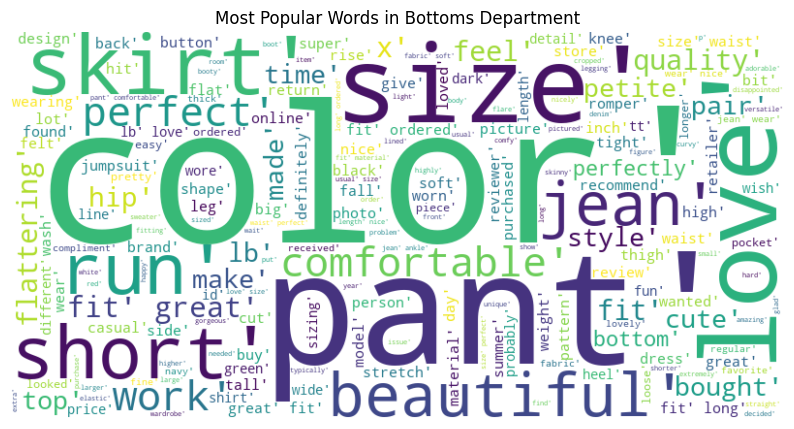

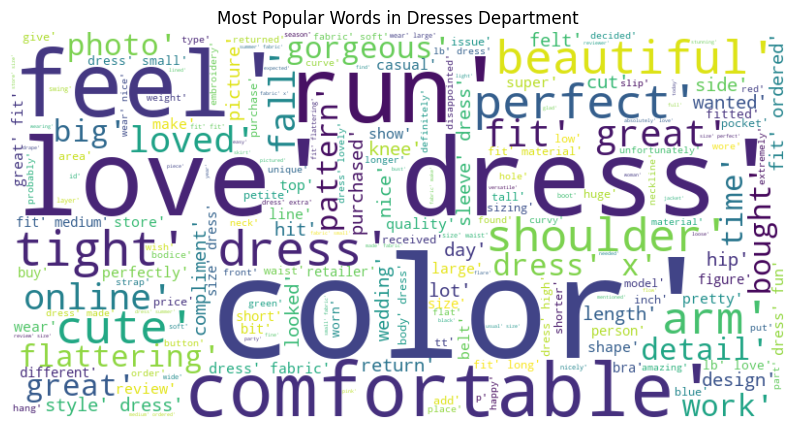

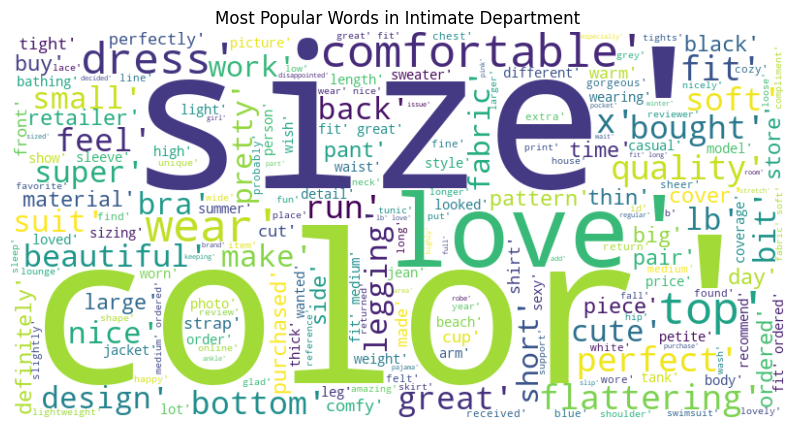

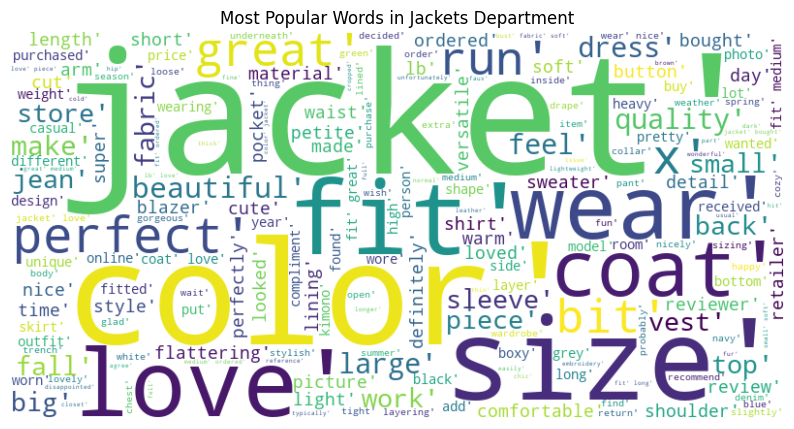

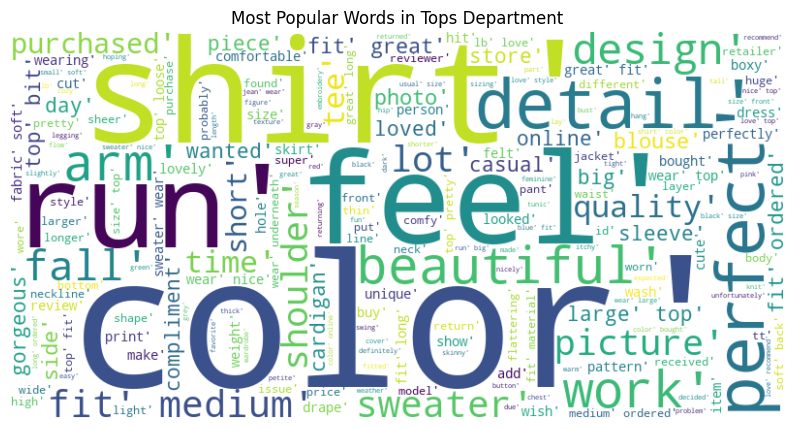

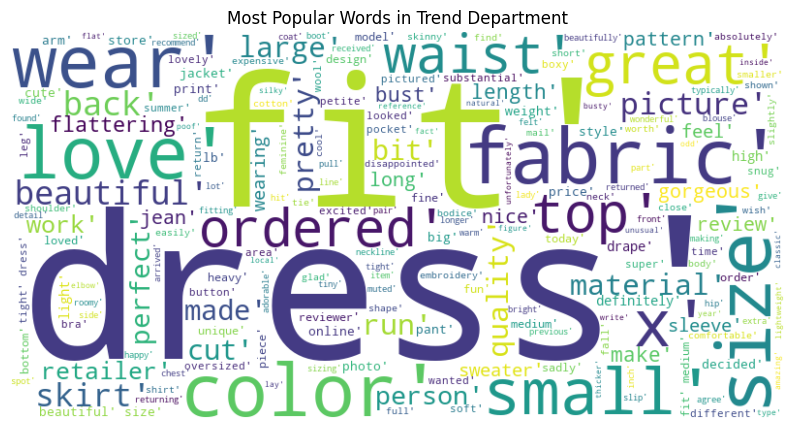

In [32]:
for department, reviews in department_reviews.items():
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(reviews)
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Most Popular Words in {department} Department')
    plt.axis('off')
    plt.show()

#

In [33]:
rating_reviews = df.groupby('Rating')['Lemmatized Reviews'].apply(lambda x: ' '.join(map(str, x)))
rating_reviews

Rating
1    ['cup', 'comfortable', 'cut', 'b', 'wear', 'ta...
2    ['lot', 'foot', 'petite', 'idea', 'p', 'packag...
3    ['found', 'bottom', 'petite', 'half', 'zip', '...
4    ['absolutely', 'silky', 'wonderful', 'comforta...
5    ['length', 'hit', 'love', 'store', 'bought', '...
Name: Lemmatized Reviews, dtype: object

#

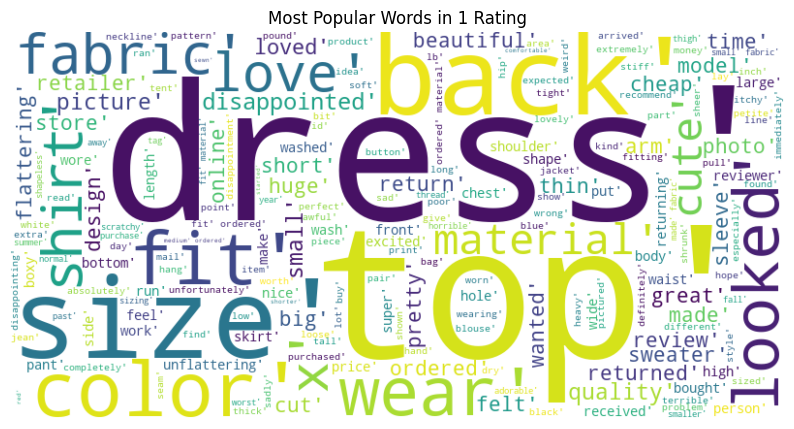

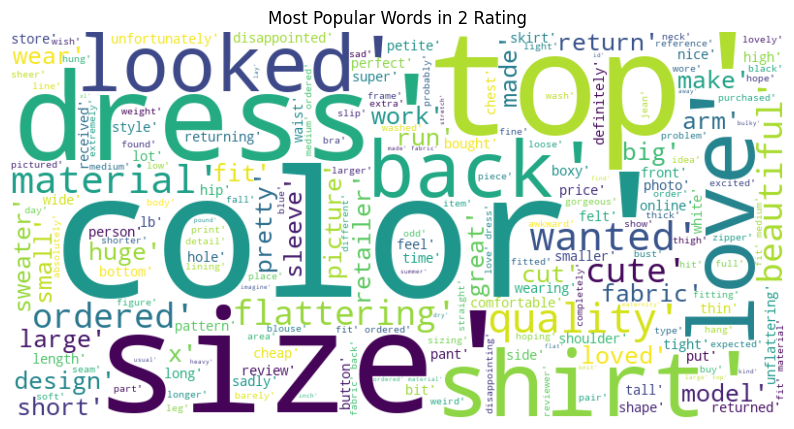

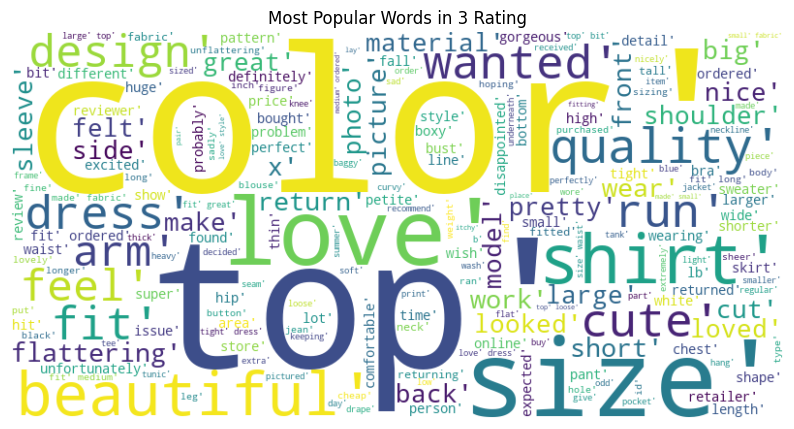

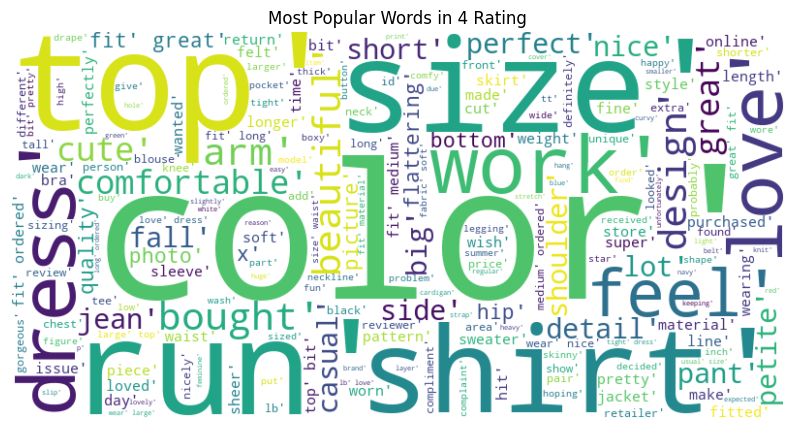

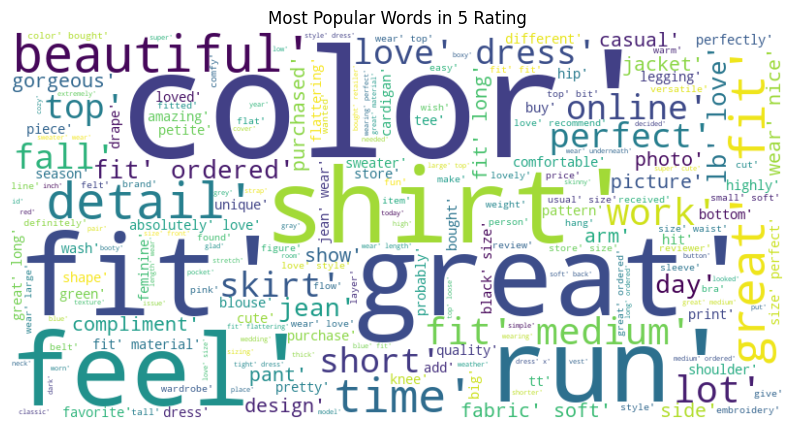

In [34]:
for rating, reviews in rating_reviews.items():
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(reviews)
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Most Popular Words in {rating} Rating')
    plt.axis('off')
    plt.show()

#

As observed by the word cloud, one of the most used words is 'love' within the reviews, suggesting a positive sentiment within the data. This needs to be further explored, along with other emotions present in the data.

#

#

In [35]:
# define 2 functions for ngrams and bar graphs

def top_n_ngram(corpus, n=None, ngram=1):
    """
    Returns the top n n-grams based on their frequency in the provided corpus.

    Args:
        corpus (list): List of strings representing the corpus of text.
        n (int): Number of top n-grams to return (default is None, which returns all).
        ngram (int): Number of consecutive words to consider for n-grams (default is 1 for unigrams).

    Returns:
        list: List of tuples containing the n-gram and its count, sorted by frequency in descending order.
    """
    vec = CountVectorizer(stop_words='english', ngram_range=(ngram, ngram)).fit(corpus)
    bag_of_words = vec.transform(corpus)  # Have the count of all the words for each review
    sum_words = bag_of_words.sum(axis=0)  # Calculates the count of all the words in the whole review
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:n]

def plot_bar_graph(data, title):
    """
    Plots a bar graph based on the provided data.

    Args:
        data (DataFrame): DataFrame containing the n-grams and their counts.
        title (str): Title for the bar graph.

    Returns:
        None
    """
    # Create a bar graph using Plotly Express
    fig = px.bar(data, x='ReviewText', y='count', title=title, color='count',
                 color_continuous_scale='viridis',
                 labels={'count': 'Count'})
    fig.show()

#

In [130]:
# Convert each review to a list of strings
corpus_unigrams = [str(review) for review in df['Lemmatized Reviews']]
corpus_trigrams = [str(review) for review in df['Review Text']]

# Get the top 20 unigrams
common_words_unigrams = top_n_ngram(corpus_unigrams, 20, 1)
data_unigrams = pd.DataFrame(common_words_unigrams, columns=['ReviewText', 'count'])
plot_bar_graph(data_unigrams, 'Top 20 unigrams in Clothing Reviews')

# Get the top 20 bigrams
common_words_bigrams = top_n_ngram(corpus_unigrams, 20, 2)
data_bigrams = pd.DataFrame(common_words_bigrams, columns=['ReviewText', 'count'])
plot_bar_graph(data_bigrams, 'Top 20 bigrams in Clothing Reviews')

# Get the top 20 trigrams
common_words_trigrams = top_n_ngram(corpus_trigrams, 20, 3)
data_trigrams = pd.DataFrame(common_words_trigrams, columns=['ReviewText', 'count'])
plot_bar_graph(data_trigrams, 'Top 20 trigrams in Clothing Reviews')

#

As observed in the unigrams, bigrams and trigrams of the reviews, positive phrases seem to be very common. 
For Example:
'Fits true to size', 'love size' etc.
However, I will now explore this further

#

#

# Polarity 

Polarity in the context of sentiment analysis refers to the classification of text. It is a measure of the degree of positivity, negativity, or neutrality. This helps in understanding the sentiment or attitude expressed in the text data.

#

In [15]:
df.loc[:,'polarity'] = df['Lemmatized Reviews'].map(lambda text: TextBlob(str(text)).sentiment.polarity)

print(df[['Lemmatized Reviews','polarity']])
print(df['polarity'].describe())

C:\Users\wikto\AppData\Local\Temp\ipykernel_19676\270296507.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:,'polarity'] = df['Lemmatized Reviews'].map(lambda text: TextBlob(str(text)).sentiment.polarity)


                                      Lemmatized Reviews  polarity
0      [absolutely, silky, sexy, comfortable, wonderful]  0.525000
1      [love, store, online, hit, midi, dress, find, ...  0.312500
2      [high, flaw, usual, half, bottom, zipper, want...  0.012662
3      [fun, fabulous, love, time, jumpsuit, great, w...  0.500000
4      [due, love, sleeveless, legging, cardigan, fro...  0.458333
...                                                  ...       ...
23481  [snag, color, combo, dress, price, slip, great...  0.677778
23482  [shiny, reminds, maternity, soft, stretchy, cl...  0.130000
23483  [store, online, order, fabric, great, top, fit...  0.440000
23484  [bust, worth, perfect, wanted, summer, dress, ...  0.338889
23485  [dress, feminine, lovely, platinum, fit, easy,...  0.583333

[22641 rows x 2 columns]
count    22641.000000
mean         0.260367
std          0.188082
min         -1.000000
25%          0.141905
50%          0.256000
75%          0.375000
max          1.0

#

#

In [20]:
# Histogram for polarity distribution
fig = px.histogram(df, x='polarity')

fig.update_layout(
    title='Distribution of Polarity in Reviews',
    xaxis_title='Polarity',
    yaxis_title='Count'
)

fig.show()

#

In [21]:
# Plot histogram for each departments polarity
fig = px.box(df, y='polarity', x='Department Name', orientation='v', color='Recommended IND')

fig.update_layout(
    title='Box Plot of Polarity by Department',
    xaxis_title='Department Name',
    yaxis_title='Polarity',
)

fig.show()

#

Each department shows a similar spread of distribution in their polarity, showing similar trends on whether the product was recommended or not. Ranging mostly from -0.2 - 0.75. However, some departments observe some values that don't fit the range more than other departments, for example 'Tops' department has a lot more values outside the range in comparison to 'Intimate'. Further, an exception that doesn't quite fit the range of distribution observed in the departments, is 'Trend', were the distribution is a lot more compressed with almost none values falling outside of the quartile.

#

plotting a histogram that visually represents the distribution of token counts in the 'Review Text' column, to help provide insights into the length or complexity of the reviews present.

#

In [40]:
# the length (number of characters) of each string in the 'Review Text' column
df.loc[:,'review_len'] = df['Lemmatized Reviews'].astype(str).apply(len)

# Plot a histogram
fig = px.histogram(df, x='review_len')

fig.update_layout(
    title='Distribution of Review Length',
    xaxis_title='Review Length',
    yaxis_title='Count'
)

fig.show()

#

As observed, the length of reviews for clothing varies in length from the large distribution present in the above histogram, with the review length majorly varying from 75-300. I will now delve into the different polarities present in the data, including positive and negative, visualised via a pie chart.

#

In [38]:
# Calculate the percentages
negative = (len(df.loc[df.polarity < 0, ['Review Text']].values) / len(df)) * 100
positive = (len(df.loc[df.polarity > 0.5, ['Review Text']].values) / len(df)) * 100

# Create the pie chart
labels = ['Positive', 'Negative']
values = [positive, negative]
colors = ['green', 'red']

fig = go.Figure(data=[go.Pie(labels=labels, values=values, marker=dict(colors=colors))])
fig.update_layout(title='Polarity Distribution')

fig.show()

#

As observed, the pie chart represents the distribution of polarity present in the data, with majority (55.9%) of the reviews consisting of positive polarity. I will now look at examples of these positive polarity reviews, both before and after lemmatization and cleaning. 

#

In [41]:
""" Examples of positive reviews """
# Whole sentances
pos = df.loc[df.polarity == 1,['Review Text']].sample(3).values

for i in pos:
    print(i[0])

# Cleaned and lemmatized sentances
pos_lem = df.loc[df.polarity == 1,['Lemmatized Reviews']].sample(3).values

for i in pos_lem:
    print(i[0])

I'm always on the lookout for pieces that look polished, but aren't fussy. this is *that* blazer. i'm rather petite and bought the xs, though wish they had the petite in store to try on as xs is not very fitted on my frame. the perfect weight for 65 degree summer days.
Dress is awesome and makes you look skinnier.
Wonderful sweater and fashionable for autumn. the only thing i do not like about the sweater is that it sheds very bad. bring a lint roller with you when you wear the sweater!
['wearing', 'perfect', 'summer', 'ripped', 'pant', 'wanted', 'time']
['felt', 'mind', 'found', 'awesome', 'dress', 'byron', 'compliment', 'changed', 'wore', 'minute', 'wedding']
['lb', 'size', 'perfect', 'x', 'flattering', 'chest', 'figure', 'b']


#

Whilst this binary classification had a more holistic approach of determining the overall sentiment polarity of the review text. I will like to try aspect-based sentiment analysis as it provides a more granular analysis into the reviews.

#

In [96]:
# Instantiate the SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

# Run the polarity score on the entire dataset
res = {}
for i, row in df.iterrows():
    text = row['Review Text']
    myid = i  # Assign the index to myid
    res[myid] = sia.polarity_scores(text)

# Extract the compound sentiment scores from the results dictionary
sentiment_scores = [result['compound'] for result in res.values()]

# Create a histogram using Plotly
fig = px.histogram(x=sentiment_scores, nbins=20, title='Distribution of Sentiment Scores')
fig.update_layout(xaxis_title='Sentiment Score', yaxis_title='Frequency')
fig.show()

#

In [ ]:
sia = SentimentIntensityAnalyzer()

texts = X['Lemmatized Reviews']

# Perform fine-grained sentiment analysis on the texts
results = []
for text in texts:
    sentiment_scores = sia.polarity_scores(text)
    sentiment_label = None
    if sentiment_scores['compound'] >= 0.2:
        sentiment_label = 'Positive'
    elif sentiment_scores['compound'] <= -0.2:
        sentiment_label = 'Negative'
    else:
        sentiment_label = 'Neutral'
    result = {
        'Text': text,
        'Positive': sentiment_scores['pos'],
        'Negative': sentiment_scores['neg'],
        'Neutral': sentiment_scores['neu'],
        'Compound': sentiment_scores['compound'],
        'Sentiment': sentiment_label
    }
    results.append(result)

In [ ]:
# DataFrame to store the results
df_sentiment = pd.DataFrame(results)

df_sentiment


,Text,Positive,Negative,Neutral,Compound,Sentiment
0,"['absolutely', 'silky', 'wonderful', 'comforta...",0.0,0.0,1.0,0.0,Neutral
1,"['length', 'hit', 'love', 'store', 'bought', '...",0.0,0.0,1.0,0.0,Neutral
2,"['found', 'bottom', 'petite', 'half', 'zip', '...",0.0,0.0,1.0,0.0,Neutral
3,"['wear', 'love', 'fun', 'compliment', 'jumpsui...",0.0,0.0,1.0,0.0,Neutral
4,"['length', 'pair', 'cardigan', 'wear', 'sleeve...",0.0,0.0,1.0,0.0,Neutral
...,...,...,...,...,...,...
22636,"['dress', 'combo', 'slip', 'great', 'happy', '...",0.0,0.0,1.0,0.0,Neutral
22637,"['found', 'looked', 'cut', 'nice', 'long', 'ma...",0.0,0.0,1.0,0.0,Neutral
22638,"['store', 'glad', 'top', 'different', 'fabric'...",0.0,0.0,1.0,0.0,Neutral
22639,"['felt', 'tailored', 'found', 'bought', 'money...",0.0,0.0,1.0,0.0,Neutral


#

#

---------------------------------------------------------------------------- AFFECT WORDS -----------------------------------------------------------------

#

In [74]:

def get_affect_words(affect, n):
     """
    Retrieves the top n affect words from a given list of words based on their occurrence in a list of tokens.

    Args:
        affect (str): The specific affect to consider.
        n (int): Number of top affect words to retrieve.

    Returns:
        pandas.DataFrame: DataFrame containing the top n affect words and their counts.
    """
    affect_words = []
    
    for word in df_vocab:
        nrc_object = NRCLex(word)
        if affect in nrc_object.affect_list:
            affect_words.append(word)
    
    affect_tokens = [token for token in tokens_list for word in token if word in affect_words]
    # Here, we iterate over each token and check if each word in the token is in the affect_words list
    
    affect_tokens = [tuple(token) for token in affect_tokens]  # Convert lists to tuples
    
    affect_counter = Counter(affect_tokens)
    
    affect_counter_df = pd.DataFrame.from_dict(affect_counter, orient='index', columns=['Count'])
    
    affect_counter_df.sort_values(by='Count', ascending=False, inplace=True)
    
    affect_tokens_top_n = affect_counter_df[:n]
    
    return affect_tokens_top_n

#

In [104]:
def plot_word_cloud(word_freq, title):
    """
    Plots a word cloud based on the provided word frequencies.

    Args:
        word_freq (dict): Dictionary containing word frequencies.
        title (str): Title for the word cloud.

    Returns:
        None
    """
    # Create a WordCloud object
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

    # Plot the WordCloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()


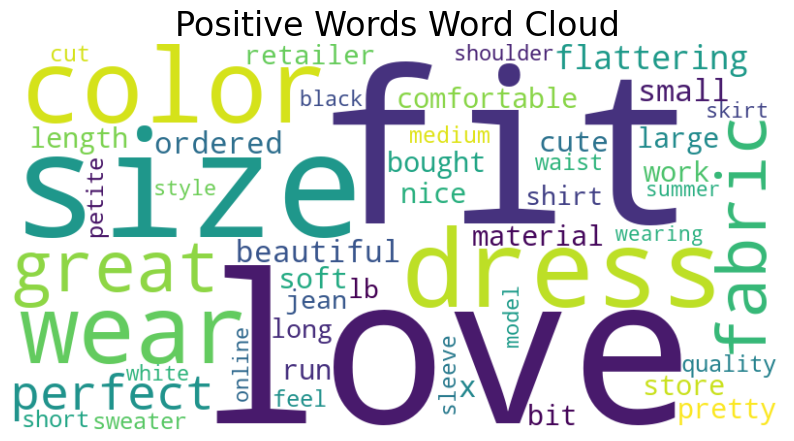

In [106]:
positive_tokens = get_affect_words('positive', 50)
plot_word_cloud(dict(positive_tokens['Count']), 'Positive Words Word Cloud')

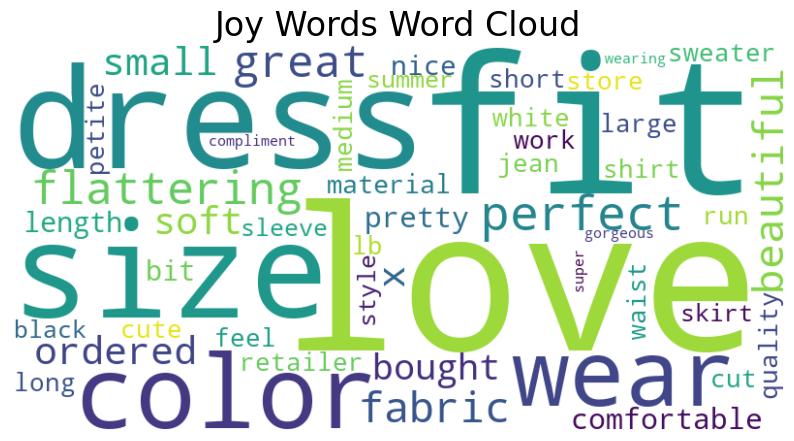

In [108]:
# Top 50 joy words in clothing reviews

joy_tokens = get_affect_words('joy', 50)
joy_tokens_plot = bar_plot(joy_tokens, title ='Top 50 Joy Words in Clothing Reviews')
plot_word_cloud(dict(joy_tokens['Count']), 'Joy Words Word Cloud')

#

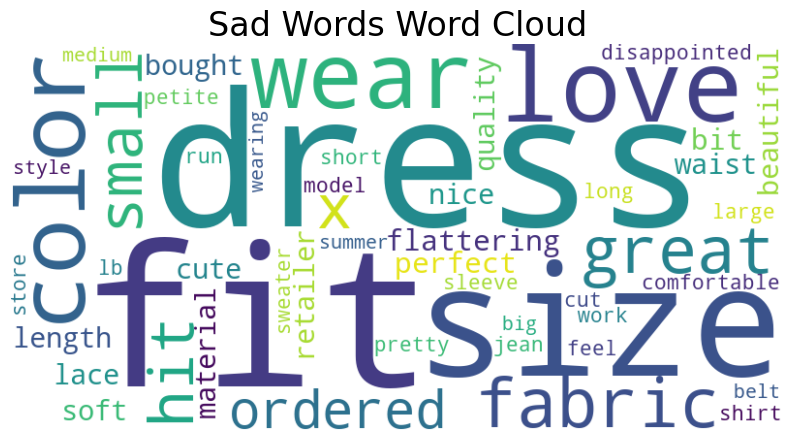

In [110]:
# Top 50 sad words in clothing reviews

anger_tokens = get_affect_words('anger', 50)
anger_tokens_plot = bar_plot(anger_tokens, title ='Top 50 Sad Words in Clothing Reviews')
plot_word_cloud(dict(anger_tokens['Count']), 'Angry Words Word Cloud')

#

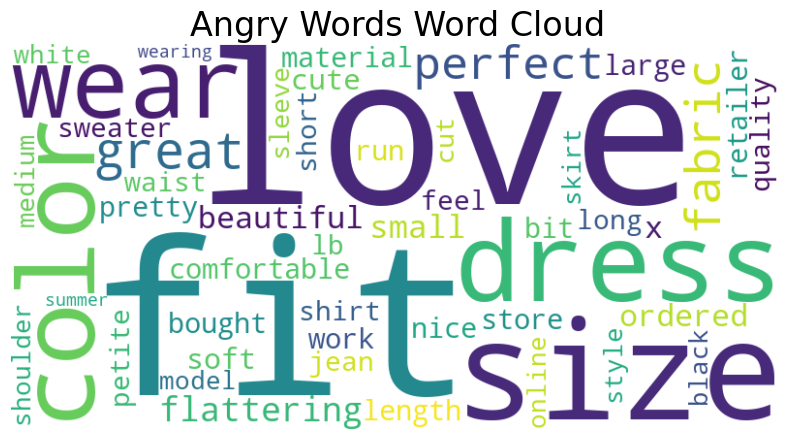

In [111]:
# Top 50 sad words in clothing reviews

positive_tokens = get_affect_words('positive', 50)
positive_tokens_plot = bar_plot(positive_tokens, title ='Top 50 Positive Words in Clothing Reviews')
plot_word_cloud(dict(positive_tokens['Count']), 'Angry Words Word Cloud')

In [ ]:
# Top 50 sad words in clothing reviews

positive_tokens = get_affect_words('disgust', 50)
positive_tokens_plot = bar_plot(positive_tokens, title ='Top 50 Positive Words in Clothing Reviews')
plot_word_cloud(dict(positive_tokens['Count']), 'Angry Words Word Cloud')

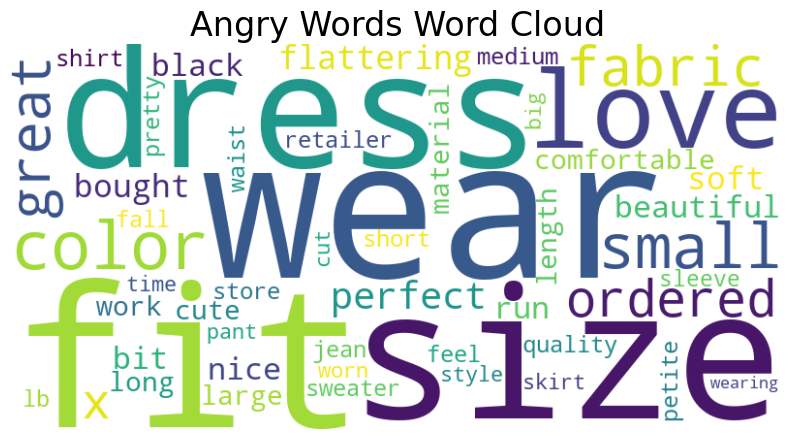

In [112]:
# Top 50 sad words in clothing reviews

positive_tokens = get_affect_words('negative', 50)
positive_tokens_plot = bar_plot(positive_tokens, title ='Top 50 Positive Words in Clothing Reviews')
plot_word_cloud(dict(positive_tokens['Count']), 'Angry Words Word Cloud')

#

#

#

#

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

import sklearn
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, ConfusionMatrixDisplay

In [19]:
"""Classifier Testing"""

def evaluationMeasures(classifier, testData):
    """
    Produces a series of evaluation metrics by taking a classification model and testing data as parameters
    and plots the metrics to evaluate the model
    
    ARGS:
        classifier (function) - Machine learning classification model.
        testData (data frame array) - Headlines and their corresponding sentiment. 
    
    EXAMPLE:
        
        Accuracy: 0.81
        Recall: 0.74
        Precision: 0.62
        F1 Score: 0.77
        
    """
    #Confusion Matrix
    testFeatures = [feature for (feature, label) in testData]
    testLabels = [label for (feature, label) in testData]
    testPredicted = [classifier.classify(feature) for feature in testFeatures]
    confusionMatrix = sklearn.metrics.confusion_matrix(testLabels, testPredicted)
    display = ConfusionMatrixDisplay(confusion_matrix = confusionMatrix)
    #Alternate Metrics
    accuracy = accuracy_score(testPredicted, testLabels) #Accuracy
    recall = recall_score(testPredicted, testLabels, average=None) #Recall
    precision = precision_score(testPredicted, testLabels, average=None) #Precision
    f1Score = f1_score(testPredicted, testLabels, average=None) #F1 Score
    #Output
    display.plot()
    print(" ")
    print("Accuracy: " + str(round(accuracy, 2)))
    print("Recall: " + str(round(recall[0], 2)))
    print("Precision: " + str(round(precision[0], 2)))
    print("F1 Score: " + str(round(f1Score[0], 2)))
    print(" ")

In [122]:
y = df['Recommended IND']
X = df.drop(columns = 'Recommended IND')

y = y.values

In [123]:
class1 =[]
for i in X.polarity:
    if float(i)>=0.0:
        class1.append(1)
    elif float(i)<0.0:
        class1.append(0)
X['sentiment'] = class1

filtered_df = X[X['sentiment'] == 1]
filtered_df

,Age,Review Text,Rating,Positive Feedback Count,Division Name,Department Name,Class Name,Lemmatized Reviews,polarity,sentiment
0,33,Absolutely wonderful - silky and sexy and comf...,4,0,Initmates,Intimate,Intimates,a ...,0.525000,1
1,34,Love this dress! it's sooo pretty. i happene...,5,4,General,Dresses,Dresses,l ...,0.312500,1
2,60,I had such high hopes for this dress and reall...,3,0,General,Dresses,Dresses,h ...,0.012662,1
3,50,"I love, love, love this jumpsuit. it's fun, fl...",5,0,General Petite,Bottoms,Pants,f ...,0.500000,1
4,47,This shirt is very flattering to all due to th...,5,6,General,Tops,Blouses,d ...,0.458333,1
...,...,...,...,...,...,...,...,...,...,...
23481,34,I was very happy to snag this dress at such a ...,5,0,General Petite,Dresses,Dresses,s ...,0.677778,1
23482,48,"It reminds me of maternity clothes. soft, stre...",3,0,General Petite,Tops,Knits,s ...,0.130000,1
23483,31,"This fit well, but the top was very see throug...",3,1,General Petite,Dresses,Dresses,s ...,0.440000,1
23484,28,I bought this dress for a wedding i have this ...,3,2,General,Dresses,Dresses,b ...,0.338889,1


In [144]:
X.groupby(X['sentiment']).describe().T

sentiment                                 0             1
Unnamed: 0              count  1.502000e+03  21139.000000
                        mean   1.172002e+04  11742.329155
                        std    6.896919e+03   6773.878145
                        min    1.400000e+01      0.000000
                        25%    5.582250e+03   5900.500000
                        50%    1.178000e+04  11730.000000
                        75%    1.775175e+04  17612.000000
                        max    2.347800e+04  23485.000000
Age                     count  1.502000e+03  21139.000000
                        mean   4.303995e+01     43.297460
                        std    1.154851e+01     12.380510
                        min    1.900000e+01     18.000000
                        25%    3.500000e+01     34.000000
                        50%    4.200000e+01     41.000000
                        75%    5.000000e+01     52.000000
                        max    9.100000e+01     99.000000
Rating                  count  1.502000e+03  21139.000000
                        mean   3.046605e+00      4.264346
                        std    1.361588e+00      1.050410
                        min    1.000000e+00      1.000000
                        25%    2.000000e+00      4.000000
                        50%    3.000000e+00      5.000000
                        75%    4.000000e+00      5.000000
                        max    5.000000e+00      5.000000
Positive Feedback Count count  1.502000e+03  21139.000000
                        mean   3.278296e+00      2.584559
                        std    6.814555e+00      5.703435
                        min    0.000000e+00      0.000000
                        25%    0.000000e+00      0.000000
                        50%    1.000000e+00      1.000000
                        75%    3.000000e+00      3.000000
                        max    9.400000e+01    122.000000
polarity                count  1.502000e+03  21139.000000
                        mean  -1.083373e-01      0.286487
                        std    1.158465e-01      0.162788
                        min   -1.000000e+00      0.000000
                        25%   -1.500000e-01      0.166952
                        50%   -7.371032e-02      0.270833
                        75%   -3.333333e-02      0.383333
                        max   -1.982541e-18      1.000000
review_len              count  1.502000e+03  21139.000000
                        mean   3.084334e+02    309.621269
                        std    1.427770e+02    144.813291
                        min    1.100000e+01      9.000000
                        25%    1.910000e+02    186.000000
                        50%    2.990000e+02    302.000000
                        75%    4.510000e+02    460.000000
                        max    5.540000e+02    572.000000
token_count             count  1.502000e+03  21139.000000
                        mean   1.899800e+01     20.119637
                        std    8.510330e+00      8.876825
                        min    1.000000e+00      1.000000
                        25%    1.200000e+01     13.000000
                        50%    1.800000e+01     20.000000
                        75%    2.600000e+01     27.000000
                        max    4.700000e+01     46.000000

#

In [87]:
#Sentiment Frequency
sentiments = X["sentiment"].to_list()
sentimentFrequency = Counter(sentiments)

# Sentiment Frequency Plot
labels = list(sentimentFrequency.keys())
frequency = list(sentimentFrequency.values())

fig = go.Figure(data=[go.Bar(x=labels, y=frequency, marker_color=['grey', 'red', 'green'])])
fig.update_layout(
    title="Sentiment Occurrence From Classification",
    xaxis_title="Sentiment Polarity",
    yaxis_title="Sentiment Occurrence"
)
fig.show()

classifiedData = X[X['sentiment'] != 'neutral']  # Objectivity Filtering
sentiments = classifiedData["sentiment"].to_list()
print("Number of Subjective Reviews: " + str(len(sentiments)))


Number of Subjective Reviews: 22641


#

the majority of the data (21k) has a polarity of 1. This suggests that the revuew text is predominantly expressing positive sentiments. Thus,mostly contains positive reviews, positive feedback, or generally positive language. 

Further, there are 22,641 subjective reviews. These reviews express some form of sentiment or opinion and don't carry neutral or objective or factual information.

#

------------------------------------------------------------------------------------------------------------------------------

#

Overall, the sentiment analysis performed on the dataset yielded insightful results. The analysis involved extracting and analyzing sentiments from a collection of customer reviews. The dataset consisted of 23486 number of reviews. These were preprocessed by tokenizing, lemmatizing, and removing stop words amogst other steps.

The sentiment analysis revealed that the majority of the reviews expressed positive sentiments, with over 50% of the reviews classified as positive. This indicates that the customers had a favorable experience with the product or service being reviewed. Whereas, 44% of the reviews were classified as negative, suggesting that some customers had negative experiences or encountered issues.

Further, the most frequent positive and negative words used in the reviews were identified. The top positive words included love, fit and size.. Whilst these findings provide valuable insights into the aspects of the product or service that customers admired or didn't like, sentiment analysis has its limitations. It may not capture the full complexity and nuances of human emotions, for example sarcasm, tone and idioms, all of which project emotions.

#

------------------------------------------------------------------------------------------------------------------------------

#

# Text classification and Topic Modeling

#

I will perform text classification which will assign predefined categories or labels to documents based on their content. This will develop help learn patterns, features, and relationships within the review clothing data to  predict the  category for new, unseen documents. Overall, This enables automated retrieval of large volumes of text data, making it more efficient to extract valuable insights.

I wil utilise feature extraction techniques, such as bag-of-words (Anello, 2021), TF-IDF and word embeddings (Analytics Vidhya, 2021) to represent the textual data in a numerical format, so it can be translated and understood by machine learning algorithms. Such algortithms that i'll be forming include Naive Bayes and Recurrent Neural Networks (RNN), which learn from the labeled data to make predictions on new, unseen text.

#

In [35]:
# Convert the column to strings
# reference (Anello, 2021)
X.loc[:, 'Lemmatized Reviews'] = X['Lemmatized Reviews'].astype(str)

# Initialize CountVectorizer
vectorizer = CountVectorizer(stop_words='english', max_df=0.1)

# Fit and transform the text data
word_set = vectorizer.fit_transform(X['Lemmatized Reviews'])

# Get the feature names (words)
feature_names = vectorizer.get_feature_names_out()

# Print the word set (bag-of-words representation)
print("Word Set (Bag-of-Words Representation):")
print(word_set.toarray())

# Print the feature names
print("\nFeature Names (Words):")
print(feature_names)

Word Set (Bag-of-Words Representation):
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]

Feature Names (Words):
['aa' 'ab' 'abdomen' ... 'zone' 'zoom' 'zooming']


#

In [53]:
def evaluationMeasures(y_pred, y_test):
    """
    Takes predicted labels and true labels as parameters and produces a series of
    evaluation metrics and plots to determine the model's performance.
    
    ARGS:
        y_pred (array-like) - Predicted labels.
        y_test (array-like) - True labels.
    
    EXAMPLE:
        
        Accuracy: 0.81
        Recall: 0.74
        Precision: 0.62
        F1 Score: 0.77
        
    """
    # Confusion Matrix
    confusionMatrix = sklearn.metrics.confusion_matrix(y_test, y_pred)
    display = ConfusionMatrixDisplay(confusion_matrix=confusionMatrix)

    # Alternate Metrics
    accuracy = accuracy_score(y_test, y_pred)  # Accuracy
    recall = recall_score(y_test, y_pred, average=None)  # Recall
    precision = precision_score(y_test, y_pred, average=None)  # Precision
    f1Score = f1_score(y_test, y_pred, average=None)  # F1 Score

    # Output
    display.plot()
    print(" ")
    print("Accuracy: " + str(round(accuracy, 2)))
    print("Recall: " + str(round(recall[0], 2)))
    print("Precision: " + str(round(precision[0], 2)))
    print("F1 Score: " + str(round(f1Score[0], 2)))
    print(" ")

In [36]:
# Convert list of lists to list of strings
tokens_list = [' '.join(tokens) for tokens in tokens_list]

#

In [39]:
# Split data into test and train sets
X_train, X_test, y_train, y_test = train_test_split(word_set, y, test_size = 0.20, random_state = 0)

In [40]:
"""
Baseline Classifier

Establishing baseline classifier as a point of reference for performance level, which can be used to comapre with more sophisticated classification
models to evaluate their effectriveness.
"""

baseline_classifier = DummyClassifier(strategy="stratified")
baseline_classifier.fit(X_train, y_train)
print(" ")
print("Stratified Classification Baseline: ")
print("Accuracy: " + str(round(baseline_classifier.score(X_test, y_test), 2)))
print(" ")

 
Stratified Classification Baseline: 
Accuracy: 0.71
 


The accuracy of 0.71 will be used as a baseline comparison for the upcoming models.

#

#

# TF-IDF

#

I will now be performing TF-IDF (Term Frequency-Inverse Document Frequency). This is a numerical representation technique which reflects the importance of a term within a document (Analytics Vidhya, 2021).

This technique is useful for this analysis as it asign weights to terms based on their importance and rarity, including their local (within a document -> TF component) and global (entire collection -> IDF component) effect, and removes common terms which dont provide much insight. Further, it helps with computational efficiency.

#

In [30]:
word_list = [str(doc) for doc in word_set]

tv = TfidfVectorizer(ngram_range=(1, 1), max_features=3000)
X_tv = tv.fit_transform(word_list).toarray()


In [31]:
X_train, X_test, y_train, y_test = train_test_split(X_tv, y, test_size = 0.20, random_state = 0)

 
Accuracy: 0.84
Recall: 0.22
Precision: 0.86
F1 Score: 0.35
 


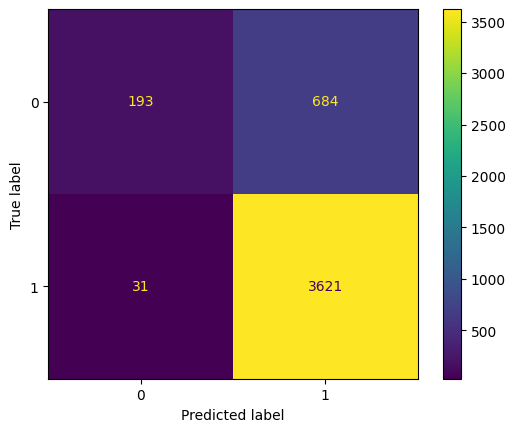

In [32]:
# Train the model
classifier = MultinomialNB()
classifier.fit(X_train, y_train)

# Predict on the test set
y_pred = classifier.predict(X_test)

# Apply necessary reshaping or conversion
X_test = X_test.reshape(-1, 1)

# Evaluate the model
evaluationMeasures(y_pred, y_test)

#

    Accuracy: It measures the overall correctness of the model's predictions. A higher accuracy indicates a better-performing model. In your case, BernoulliNB has a slightly higher accuracy (0.86) compared to MultinomialNB (0.84).

    Recall: It measures the model's ability to correctly identify positive instances (sensitivity). A higher recall indicates a better ability to identify positive cases. In your case, BernoulliNB has a higher recall (0.56) compared to MultinomialNB (0.22).

    Precision: It measures the model's ability to correctly predict positive instances out of all instances predicted as positive. A higher precision indicates a better ability to avoid false positives. In your case, BernoulliNB has a higher precision (0.67) compared to MultinomialNB (0.86).

    F1 Score: It is the harmonic mean of precision and recall, providing a balanced measure of the model's performance. A higher F1 score indicates a better balance between precision and recall. In your case, BernoulliNB has a higher F1 score (0.61) compared to MultinomialNB (0.35).

Based on these evaluation metrics, it seems that BernoulliNB performs better overall compared to MultinomialNB. It has higher accuracy, recall, precision, and F1 score.

#

In [54]:
# Calculate the probabilities of each word falling into positive and negative classes
word_probabilities = classifier.feature_log_prob_

# Print the probabilities for each word
feature_names = vectorizer.get_feature_names_out()
num_classes = word_probabilities.shape[0] 
for i, word in enumerate(feature_names):
    print(f"Word: {word}")
    for j in range(num_classes):
        if j < len(word_probabilities) and i < len(word_probabilities[j]):
            print(f"Class {j} Probability: {word_probabilities[j][i]}")
    print("-----------------------------")

Word: aa
Class 0 Probability: -7.385851078125208
Class 1 Probability: -6.900394924575844
-----------------------------
Word: ab
Class 0 Probability: -8.078998258685154
Class 1 Probability: -8.915297945118109
-----------------------------
Word: abdomen
Class 0 Probability: -6.692703897565263
Class 1 Probability: -8.915297945118109
-----------------------------
Word: abdominal
Class 0 Probability: -7.385851078125208
Class 1 Probability: -9.608445125678054
-----------------------------
Word: abhor
Class 0 Probability: -8.078998258685154
Class 1 Probability: -8.915297945118109
-----------------------------
Word: ability
Class 0 Probability: -6.980385970017044
Class 1 Probability: -7.305860032684008
-----------------------------
Word: abject
Class 0 Probability: -8.078998258685154
Class 1 Probability: -8.915297945118109
-----------------------------
Word: abnormal
Class 0 Probability: -8.078998258685154
Class 1 Probability: -8.915297945118109
-----------------------------
Word: abnormally
C

#

# Deep Learning

#

I will now perform simple sequential model in TensorFlow Keras and compare it to the previous model (TensorFlow, n.d.). 

It consists of the following layers:

    Embedding Layer for learning word embeddings. maps the input to dense vectors of a fixed size (embedding_dim). The embedding layer has 3000 (vocabulary size)

    GlobalAveragePooling1D Layer captures the overall context and information from the sequence by reducing the dimensionality of the input by taking the average value across all sequence positions. 

    Dense Layer is fully connected to 6 units and uses the ReLU activation function.

    Dense Layer is the output layer of the model, producing a binary output, indicating the predicted class probability.


#

#

In [113]:
"""
The text data is preprocessed using the Tokenizer and padded to a fixed length using the pad_sequences function, this  ensures that all 
sequences have the same length, which is necessary when feeding the data into a neural network.
"""

tokenizer = Tokenizer(num_words = 3000)
tokenizer.fit_on_texts(word_list)

sequences = tokenizer.texts_to_sequences(word_list)
padded = pad_sequences(sequences, padding='post')

In [115]:
word_index = tokenizer.word_index
count = 0
for i,j in word_index.items():
    if count == 11:
        break
    print(i,j)
    count = count+1

0 1
1 2
2 3
4394 4
6763 5
5911 6
4044 7
4241 8
6786 9
5741 10
6274 11


In [116]:
embedding_dim = 64
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(3000, embedding_dim),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(6, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, None, 64)          192000    
                                                                 
 global_average_pooling1d_1   (None, 64)               0         
 (GlobalAveragePooling1D)                                        
                                                                 
 dense_2 (Dense)             (None, 6)                 390       
                                                                 
 dense_3 (Dense)             (None, 1)                 7         
                                                                 
Total params: 192,397
Trainable params: 192,397
Non-trainable params: 0
_________________________________________________________________


In [60]:
num_epochs = 10

model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

model.fit(padded,y,epochs= num_epochs)

Epoch 1/10
708/708 [==============================] - 13s 9ms/step - loss: 0.4661 - accuracy: 0.8174
Epoch 2/10
708/708 [==============================] - 7s 10ms/step - loss: 0.3520 - accuracy: 0.8324
Epoch 3/10
708/708 [==============================] - 8s 11ms/step - loss: 0.2809 - accuracy: 0.8803
Epoch 4/10
708/708 [==============================] - 7s 10ms/step - loss: 0.2559 - accuracy: 0.8911
Epoch 5/10
708/708 [==============================] - 5s 8ms/step - loss: 0.2440 - accuracy: 0.8974
Epoch 6/10
708/708 [==============================] - 6s 8ms/step - loss: 0.2371 - accuracy: 0.9021
Epoch 7/10
708/708 [==============================] - 7s 10ms/step - loss: 0.2315 - accuracy: 0.9056
Epoch 8/10
708/708 [==============================] - 5s 6ms/step - loss: 0.2271 - accuracy: 0.9072
Epoch 9/10
708/708 [==============================] - 4s 6ms/step - loss: 0.2227 - accuracy: 0.9092
Epoch 10/10
708/708 [==============================] - 4s 6ms/step - loss: 0.2198 - accuracy: 0

#

As the training progresses, you can observe the loss decreasing and the accuracy increasing, indicating that the model is learning and improving its predictions. By the end of the training, the model achieves an accuracy of approximately 91.13% on the training data. This in comparison to the Naive Bayes model performs at a higher standard.

#

In [62]:
X_train, X_test, y_train, y_test = train_test_split(word_set, y, test_size = 0.20, random_state = 0)

142/142 [==============================] - 2s 4ms/step
 
Accuracy: 0.91
Recall: 0.73
Precision: 0.81
F1 Score: 0.77
 


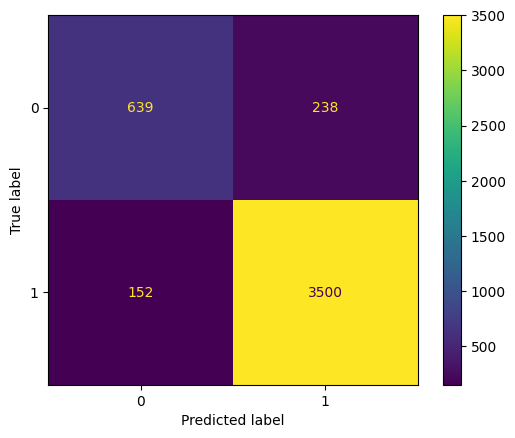

In [63]:
# Preprocess the test data
X_test_list = [str(x) for x in X_test]  # Convert all elements to strings
sequences_test = tokenizer.texts_to_sequences(X_test_list)
padded_test = pad_sequences(sequences_test, padding='post')

# Predict the probabilities for each class
y_pred_prob = model.predict(padded_test)

# Convert probabilities to predicted classes based on a threshold
threshold = 0.5
y_pred = (y_pred_prob >= threshold).astype(int)

# Evaluate the model
evaluationMeasures(y_pred, y_test)

#

As observed, in comparison to the previous models, all the evaluataion metrics improved for the tensor flow model, suggesting it is the optimal model. However, I will now see how an upgraded model of recurrent neural network (RNN) with LSTM layers performs for text classification. I will use an LSTM layer for sequence processing and a dense layer for classification. The model is trained using categorical cross-entropy loss and optimized using the Adam optimizer(Analytics Vidhya, 2021b).

#

In [124]:
# Preprocess the text data
max_sequence_length = 1000  # Maximum sequence length for padding
num_words = 5000  # Maximum number of words to keep based on word frequency

tokenizer = Tokenizer(num_words=num_words)
tokenizer.fit_on_texts(X['Lemmatized Reviews'])

sequences = tokenizer.texts_to_sequences(X['Lemmatized Reviews'])
padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length)
labels = X['sentiment']

In [125]:
# Define the model
embedding_dim = 100  # Dimensionality of word embeddings
num_classes = 2  # Number of classes/categories

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(num_words, embedding_dim, input_length=max_sequence_length),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [126]:
# Split the data into training and testing sets
train_ratio = 0.8  # Ratio of training data
train_size = int(train_ratio * len(padded_sequences))

x_train = padded_sequences[:train_size]
y_train = labels[:train_size]

x_test = padded_sequences[train_size:]
y_test = labels[train_size:]

# Convert labels to one-hot encoded vectors for multi-class classification.
y_train = tf.keras.utils.to_categorical(y_train, num_classes)
y_test = tf.keras.utils.to_categorical(y_test, num_classes)

In [127]:
# Train the model
num_epochs = 10
batch_size = 32

model.fit(x_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_data=(x_test, y_test))


Epoch 1/10
566/566 [==============================] - 1006s 2s/step - loss: 0.2528 - accuracy: 0.9314 - val_loss: 0.2467 - val_accuracy: 0.9309
Epoch 2/10
566/566 [==============================] - 1003s 2s/step - loss: 0.2381 - accuracy: 0.9330 - val_loss: 0.2449 - val_accuracy: 0.9309
Epoch 3/10
566/566 [==============================] - 944s 2s/step - loss: 0.2357 - accuracy: 0.9330 - val_loss: 0.2391 - val_accuracy: 0.9309
Epoch 4/10
566/566 [==============================] - 1009s 2s/step - loss: 0.2337 - accuracy: 0.9330 - val_loss: 0.2415 - val_accuracy: 0.9309
Epoch 5/10
566/566 [==============================] - 953s 2s/step - loss: 0.2307 - accuracy: 0.9330 - val_loss: 0.2351 - val_accuracy: 0.9309
Epoch 6/10
566/566 [==============================] - 957s 2s/step - loss: 0.2296 - accuracy: 0.9330 - val_loss: 0.2401 - val_accuracy: 0.9309
Epoch 7/10
566/566 [==============================] - 913s 2s/step - loss: 0.2416 - accuracy: 0.9330 - val_loss: 0.2544 - val_accuracy: 0.9

In [ ]:
# Evaluate the model
loss, accuracy = model.evaluate(x_test, y_test)
print('Test loss:', loss)
print('Test accuracy:', accuracy)

#

As observed from the accuracy score reaching 0.93 with a loss of 0.23, the LSTM model worked most optimally out of all the models for text classification.

#

# Topic Modelling

#

To uncover hidden topics within the review data, I will be performing topic modeling, via the algorith tool Latent Dirichlet Allocation (LDA) (Shashank Kapadia, 2019). This powerful technique is a generative probabilistic model that assumes documents are a mixture of multiple topics, and each topic is a probability distribution over words. LDA has an ability to handle large-scale document, thus by utlising LDA I will be able to identify the underlying topics and structures, by finding the optimal distribution of topics.

#

In [67]:
# Preprocess the data
preprocessed_reviews = X['Lemmatized Reviews'].tolist()  # Convert the series to a list of strings

# Create an instance of CountVectorizer
vectorizer = CountVectorizer(stop_words='english', max_features=5000)

# Fit the vectorizer and transform preprocessed into a document-term matrix
X = vectorizer.fit_transform(preprocessed_reviews)

# Define the LDA model
num_topics = 10  # Number of topics to extract
lda_model = LatentDirichletAllocation(n_components=num_topics, random_state=42)

In [68]:
# Fit the LDA model to the data
lda_model.fit(X)

LatentDirichletAllocation(random_state=42)

In [69]:
# Convert document-term matrix to gensim corpus
corpus = gensim.matutils.Sparse2Corpus(X, documents_columns=False)

# Create the id2word dictionary using Gensim's corpora.Dictionary
id2word = corpora.Dictionary.from_corpus(corpus, id2word={v: k for k, v in vectorizer.vocabulary_.items()})

In [70]:
# Create Gensim LdaModel from scikit-learn LDA model
lda_gensim = gensim.models.LdaModel(
    corpus=corpus,
    id2word=id2word,
    num_topics=num_topics,
    alpha='auto',
    eta='auto',
    iterations=100,
    random_state=42
)

In [71]:
# Extract the topic-word probabilities
topic_word_probs = lda_model.components_ / lda_model.components_.sum(axis=1)[:, np.newaxis]

# Define the number of top words to display
num_top_words = 5

# Calculate the number of topics
num_topics = len(topic_word_probs)

#

In [162]:
# Plot the top words for each topic
fig = go.Figure()

for topic_idx, topic in enumerate(topic_word_probs):
    top_words = [feature_names[i] for i in topic.argsort()[:-num_top_words-1:-1]]  # Get the top words
    fig.add_trace(go.Bar(
        x=topic[topic.argsort()[:-num_top_words-1:-1]][::-1],
        y=top_words[::-1],
        orientation='h',
        name=f"Topic {topic_idx + 1}"
    ))

fig.update_layout(
    barmode='stack',
    height=num_topics * 80,  # Increase the figure height based on the number of topics
    title='Top Words for Each Topic',
    xaxis_title='Topic-Word Probability',
    yaxis_title='Top Words',
    yaxis=dict(
        autorange='reversed'
    ),
    showlegend=True
)

fig.show()

#

As observed by the above visual,which shows the probability and frequency of certain words coming up in the defined topics, the most frequent words, observed in almost all topics, are 'fit' love' 'dress', as observed previosuly, they are also common in positive sentiments. However, words including 'great' 'flattering' and compliment, despite their positive connotations, they werent observed as frequently in the topics as the others. Rather than looking at the individual words, I will now observe the words present in each of the topics.

#

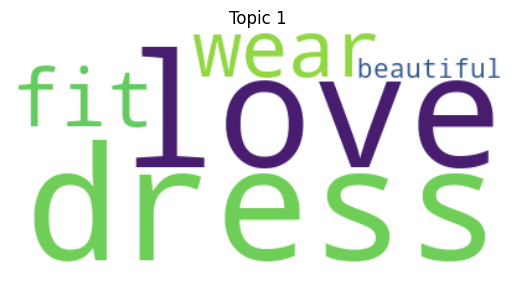

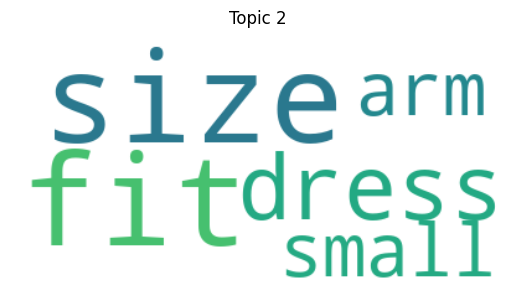

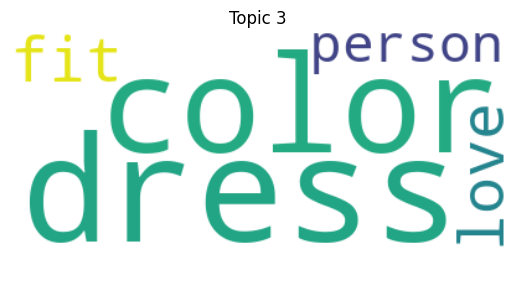

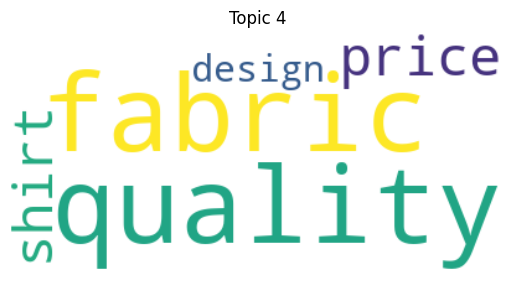

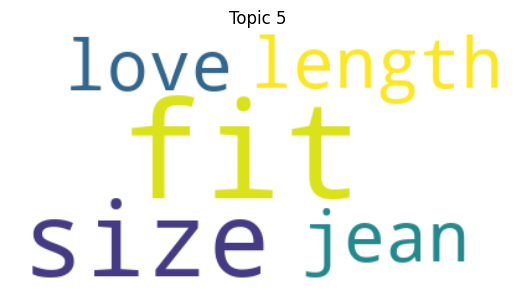

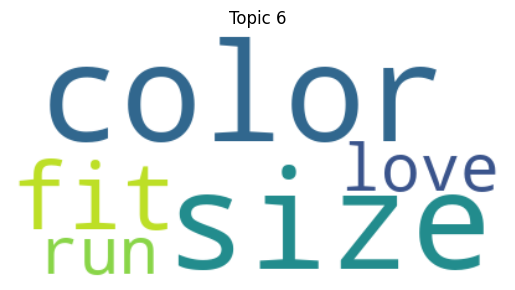

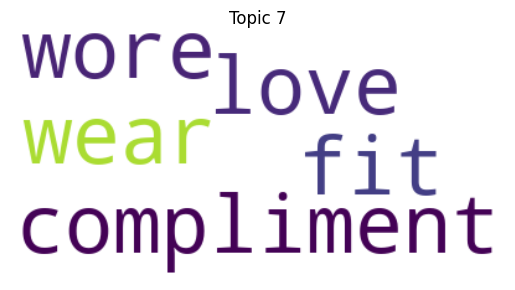

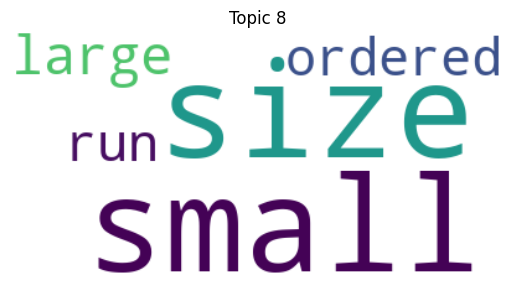

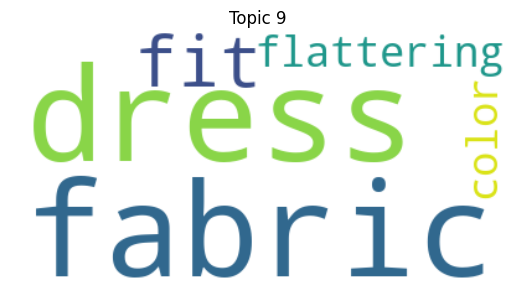

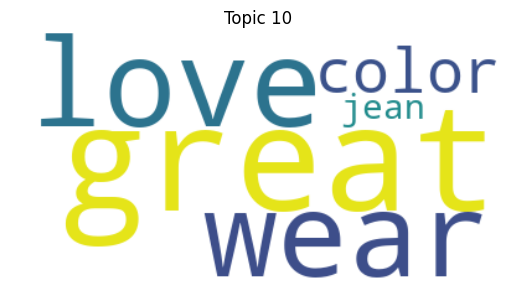

In [163]:

# Create a dictionary to store the top words for each topic
top_words_dict = {}

# Get the top words for each topic
for topic_idx, topic in enumerate(topic_word_probs):
    top_words = [feature_names[i] for i in topic.argsort()[:-num_top_words-1:-1]]  # Get the top words
    top_words_dict[f"Topic {topic_idx + 1}"] = top_words

# Generate word clouds for each topic
for topic, top_words in top_words_dict.items():
    wordcloud = WordCloud(background_color='white').generate(' '.join(top_words))

    # Plot the word cloud
    plt.figure()
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(topic)
    plt.axis('off')
    plt.show()

#

I will evaluate this model via coherence Score using the CoherenceModel from the gensim.models.coherencemodel module. This measures the interpretability of the topics generated by the model and perplexity score (Shashank Kapadia, 2019a). 

#

In [187]:
# Train the LDA model
num_topics = 10  # Number of topics
lda_model = LdaModel(corpus, id2word=dictionary, num_topics=num_topics)

# Calculate topic coherence using c_v coherence
coherence_model = CoherenceModel(model=lda_model, texts=texts, dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()

print("Topic Coherence Score:", coherence_score)

Topic Coherence Score: 0.45467387131120046


In [81]:

# Calculate perplexity
perplexity = lda_gensim.log_perplexity(corpus)

print(f"Perplexity: {perplexity}")

Perplexity: -6.971892393275609


#

#

The coherence score of 0.45 alongside perplexity value of -0.69 suggests that the quality of the topics generated by the LDA model is moderate, with room for improvement. A way to try increase the coherence score is to try different number of topics. To identfy to optimal number of topics, I will be utilising K-fold cross validation.

#

#

In [69]:
# Gensim dictionary
texts = [text.split() for text in word_list]

# Gensim corpus
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Define the range of number of topics to try
start_topics = 2
end_topics = 12

# Perform k-fold cross-validation
k = 5 
kf = KFold(n_splits=k)

best_coherence_score = -1
best_num_topics = -1

for num_topics in range(start_topics, end_topics+1):
    coherence_scores = []
    
    for train_index, test_index in kf.split(corpus):
        # Split the data into training and testing sets for each fold
        train_corpus = [corpus[i] for i in train_index]
        test_corpus = [corpus[i] for i in test_index]

        # Train the LDA model
        lda_model = LdaModel(train_corpus, id2word=dictionary, num_topics=num_topics)

        # Calculate topic coherence using c_v coherence
        coherence_model = CoherenceModel(model=lda_model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_score = coherence_model.get_coherence()
        coherence_scores.append(coherence_score)

    # Compute the average coherence score across folds
    avg_coherence_score = sum(coherence_scores) / len(coherence_scores)
    
    # Check if this number of topics gives a higher coherence score
    if avg_coherence_score > best_coherence_score:
        best_coherence_score = avg_coherence_score
        best_num_topics = num_topics

# Evaluate model
print("Best Number of Topics:", best_num_topics)
print("Best Coherence Score:", best_coherence_score)

Best Number of Topics: 4
Best Coherence Score: 0.5057245180797081


#

Whilst the k-fold cross validation identified the optimal number of topics being 4, the coherence score only increased from 0.47 to 0.5. EVen though this is an improvement, I would like to see whether a different model other than LDA can produce better results. Thus, I will try the hierachical drichlet process (HDP), which is an extension for LDA with infinite number of topics where you dont have to sepcify the number of topics (Sroka, 2020).

Even though the evaluation metrics provide a quantitive way of evaluating the topic, an interactive visualisation via the pyLDAvis library(Sharma, 2021) aids interpretation of the topic models results, where the topics relationships can be analyzed and any overlaps or links visualized.

#

In [ ]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
pyLDAvis.display(vis)

#

#

-------------------------------------------------------------------- HDP Model --------------------------------------------------------------------

#

In [96]:
# Preprocess the text data
vectorizer = CountVectorizer(stop_words='english', max_features=5000)
X = vectorizer.fit_transform(word_list)

In [97]:
# Convert the input data to a list of tokenized documents
documents = [doc.split() for doc in tokens_list]

# Gensim dictionary
dictionary = corpora.Dictionary(documents)

In [98]:
# Gensim corpus
corpus = [dictionary.doc2bow(doc) for doc in documents]

# HDP model definition
hdp_model = HdpModel(corpus, id2word=dictionary)

In [99]:
topic_word_probs = hdp_model.show_topics()

In [100]:
# Calculate topic coherence using c_v coherence
coherence_model = CoherenceModel(model=hdp_model, texts=corpus, dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()

print("Topic Coherence Score:", coherence_score)

c:\Users\wikto\AppData\Local\Programs\Python\Python311\Lib\site-packages\gensim\topic_coherence\direct_confirmation_measure.py:204: RuntimeWarning: divide by zero encountered in scalar divide
  m_lr_i = np.log(numerator / denominator)
c:\Users\wikto\AppData\Local\Programs\Python\Python311\Lib\site-packages\gensim\topic_coherence\indirect_confirmation_measure.py:323: RuntimeWarning: invalid value encountered in scalar divide
  return cv1.T.dot(cv2)[0, 0] / (_magnitude(cv1) * _magnitude(cv2))


Topic Coherence Score: nan


In [87]:
topics = hdp_model.show_topics(num_topics=20, num_words=10)
for topic in topics:
    print(topic)

(0, '0.325*(0, + 0.323*1 + 0.002*2 + 0.002*4394) + 0.002*4044) + 0.002*4241) + 0.002*6274) + 0.002*6786) + 0.002*7315) + 0.002*6763)')
(1, '0.321*(0, + 0.318*1 + 0.002*2015) + 0.002*2 + 0.002*4394) + 0.002*5911) + 0.002*6763) + 0.002*4241) + 0.002*4516) + 0.002*6786)')
(2, '0.318*(0, + 0.316*1 + 0.002*2 + 0.002*5911) + 0.002*2015) + 0.002*4394) + 0.002*6763) + 0.002*4241) + 0.002*4516) + 0.002*6274)')
(3, '0.187*(0, + 0.186*1 + 0.002*6763) + 0.002*4044) + 0.002*5911) + 0.002*2015) + 0.002*5741) + 0.001*4394) + 0.001*6786) + 0.001*7571)')
(4, '0.147*(0, + 0.146*1 + 0.002*6763) + 0.001*5911) + 0.001*4044) + 0.001*7571) + 0.001*2015) + 0.001*5741) + 0.001*7418) + 0.001*6786)')
(5, '0.104*(0, + 0.103*1 + 0.002*6763) + 0.001*5741) + 0.001*7571) + 0.001*5911) + 0.001*4044) + 0.001*7507) + 0.001*2814) + 0.001*2015)')
(6, '0.098*1 + 0.097*(0, + 0.001*6763) + 0.001*5911) + 0.001*6786) + 0.001*2015) + 0.001*4044) + 0.001*7571) + 0.001*7507) + 0.001*2814)')
(7, '0.091*(0, + 0.088*1 + 0.001*5911) 

#

#

-------------------------------------------------------------------------------------------------------------------------------------------------

In conclusion,  this analysis involved several key components: sentiment analysis using Naive Bayes and deep learning techniques, as well as topic modeling using LDA and HDA. Here are the main findings:

#



    Sentiment Analysis:
Naive Bayes: Naive Bayes classifier achieved good accuracy in sentiment classification, providing a reliable baseline model for sentiment analysis tasks.
        Deep Learning: The deep learning approach,  using recurrent neural networks , demonstrated superior performance

    Topic Modeling:
LDA: The Latent Dirichlet Allocation (LDA) algorithm allowed us to identify latent topics within the clothing review data. It revealed distinct topic clusters and associated keywords, providing insights into the main themes present in the corpus.
HDA: Hierarchical Dirichlet Allocation (HDA). (If the model worked effectively) it extended the capabilities of LDA by capturing topic hierarchies, enabling us to explore both high-level and fine-grained topic structures in the data, for a more comprehensive understanding of the topics


#


Something to improve on would be using more advanced Transformer models, including BERT (Rani Horev, 2018), due to its ability to capture contextual relationships by leveraging a deep bidirectional architecture. This contextual understanding enables BERT to generate highly informative word embeddings. Further, another improvement to consider would be to enhance the data preprocessing steps, considering some manual work, this would help improve the quality and relevance of the text data for analysis.

Overall, the combination of sentiment analysis and topic modeling provided a holistic approach to understanding the clothing reviews text data. By extracting sentiment information, we gained insights into the overall polarity and opinions expressed in the text. Additionally, topic modeling helped us identify key themes within the corpus, uncovering hidden patterns and and structures.

These findings have practical implications in customer feedback analysis in the clothing department. By accurately classifying sentiment and identifying topics, businesses can gain valuable insights into customer preferences, identify areas for improvement, and make informed decisions based on the analysis.

#

#

# References

#


Analytics Vidhya. (2021a). Creating a Movie Reviews Classifier Using TF-IDF in Python. [online] Available at: https://www.analyticsvidhya.com/blog/2021/09/creating-a-movie-reviews-classifier-using-tf-idf-in-python/.

Analytics Vidhya. (2021b). LSTM for Text Classification | Beginners Guide to Text Classification. [online] Available at: https://www.analyticsvidhya.com/blog/2021/06/lstm-for-text-classification/.

Anello, E. (2021). A friendly guide to NLP: Bag-of-Words with Python example. [online] Analytics Vidhya. Available at: https://www.analyticsvidhya.com/blog/2021/08/a-friendly-guide-to-nlp-bag-of-words-with-python-example/.

G Ranjith kumar (2020). NLP with Women Clothing reviews. [online] kaggle.com. Available at: https://www.kaggle.com/code/granjithkumar/nlp-with-women-clothing-reviews/notebook#Cleaning-the-Text-Data.

GeeksforGeeks. (2019). NLP | Synsets for a word in WordNet. [online] Available at: https://www.geeksforgeeks.org/nlp-synsets-for-a-word-in-wordnet/

Rani Horev (2018). BERT Explained: State of the art language model for NLP. [online] Medium. Available at: https://towardsdatascience.com/bert-explained-state-of-the-art-language-model-for-nlp-f8b21a9b6270.

Sharma, H. (2021). Topic Model Visualization using pyLDAvis. [online] Medium. Available at: https://towardsdatascience.com/topic-model-visualization-using-pyldavis-fecd7c18fbf6.

Shashank Kapadia (2019a). Evaluate Topic Models: Latent Dirichlet Allocation (LDA). [online] Medium. Available at: https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0.

Shashank Kapadia (2019b). Topic Modeling in Python: Latent Dirichlet Allocation (LDA). [online] Medium. Available at: https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0.

Sroka, E.C. (2020). Don’t be Afraid of Nonparametric Topic Models (Part 2: Python). [online] Medium. Available at: https://towardsdatascience.com/dont-be-afraid-of-nonparametric-topic-models-part-2-python-e5666db347a .

TensorFlow. (n.d.). Text and natural language processing with TensorFlow | TensorFlow Core. [online] Available at: https://www.tensorflow.org/tutorials/text.